In [1]:
import pandas
from pandas.tools.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import cross_validation
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

import numpy as np
from sklearn.externals import joblib
import scipy.integrate as integrate
import glob
%matplotlib inline

plt.rcParams["font.family"] = "serif"

//anaconda/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
lda = joblib.load('LDA_Model.pkl')
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog = np.loadtxt(Iax_dir+"/images/sn2008ha/sn2008ha.phot.out")

//anaconda/lib/python3.5/site-packages/sklearn/base.py:315: UserWarning: Trying to unpickle estimator LinearDiscriminantAnalysis from version pre-0.18 when using version 0.18.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)
//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: DeprecationWarning: The file 'LDA_Model.pkl' has been generated with a joblib version less than 0.10. Please regenerate this pickle file.
  if __name__ == '__main__':


In [4]:
# Removes points with nan. It is assumed that these are all magnitude measurements, so they are set to their max.
flat = catalog.flatten()
for i in range(flat.size):
    if (np.isnan(flat[i])) or (not np.isfinite(flat[i])):
        flat[i] = 99.999
        catalog[i//271][i%271] = 99.999
        print(i)

19012
19220
29284
29310
29323
29375
29479
29531
36356
36577
42318
42513
42834
42860
42873
42912
43016
43068
47467
47662
51803
52024
64269
64451
78361
78543
79961
79987
80000
80039
80143
80195
81071
81266
83781
83989
85381
85407
85420
85459
85563
85615
90285
90467
94324
94350
94363
94415
94519
94571
100041
100236
100312
100494
108171
108379
112236
112431
114404
114599
117114
117296
118172
118198
118211
118237
118341
118393
118714
118740
118753
118805
118909
118961
137981
138176
148279
148487
151802
152010
156680
156875
170772
170967
173753
173961
175082
175108
175121
175147
175251
175303
184838
184864
184877
184903
185007
185059
204350
204376
204389
204441
204545
204597
226056
226264
227682
227890
233102
233310
237438
237646
238793
238975
239001
250446
250641
253427
253635
257763
257958
265622
265830
267493
267519
267532
267584
267688
267740
271584
271792
277546
277741
278875
278901
278914
278953
279057
279109
292180
292388
300852
301047
306001
306209
307085
307293
310608
310790
312479


In [5]:
cat_predictions=lda.predict(catalog) # Contains the predicted good/bad points

In [3]:
pos_predict = np.zeros((catalog.shape[0],2))
info_predict = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog[i][5] >= 3.5)&(abs(catalog[i][6]) < .3)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .1)):
        pos_predict[j][0] = catalog[i][2] # Assigns X position
        pos_predict[j][1] = catalog[i][3] # Assigns Y position
        info_predict[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict = pos_predict[~np.all(pos_predict == 0, axis=1)]
info_predict = info_predict[~np.all(info_predict == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2008ha_Prediction.reg", pos_predict, '%5.2f')

# Load in stars in ROI identified by eye as good and create CMDs

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_200pc.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([28,2])
for i in range(28):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
infoF3 = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        infoF3[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_133pc.reg", "r+")

text = asci.readlines()
region = np.zeros([9,2])
for i in range(9):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF2 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF3.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF3[i][2:4]):
        infoF2[j] = infoF3[i]
        j = j + 1
        if j == region.shape[0]: break

In [6]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_67pc.reg", "r+")

text = asci.readlines()
region = np.zeros([2,2])
for i in range(2):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF1 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF2.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF2[i][2:4]):
        infoF1[j] = infoF2[i]
        j = j + 1
        if j == region.shape[0]: break

[-2, 3, 30, 24]

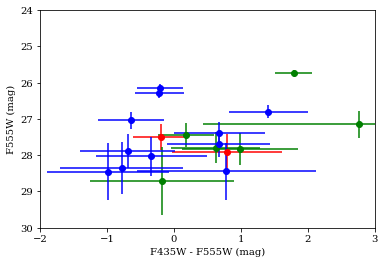

In [7]:
for i in range(infoF3.shape[0]):
    for j in range(infoF2.shape[0]):
        if np.array_equal(infoF3[i],infoF2[j]):
            infoF3[i] = np.zeros(infoF3[i].size)
for i in range(infoF2.shape[0]):
    for j in range(infoF1.shape[0]):
        if np.array_equal(infoF2[i],infoF1[j]):
            infoF2[i] = np.zeros(infoF2[i].size)

infoF2 = infoF2[~np.all(infoF2 == 0, axis=1)]
infoF3 = infoF3[~np.all(infoF3 == 0, axis=1)]
# F555W vs F435W - F555W
F435W_F1 = infoF1[:,15]
xerr_F1 = np.sqrt(infoF1[:,17]**2 + infoF1[:,30]**2)
F555W_F1 = infoF1[:,28]
yerr_F1 = infoF1[:,30]

F435W_F2 = infoF2[:,15]
xerr_F2 = np.sqrt(infoF2[:,17]**2 + infoF2[:,30]**2)
F555W_F2 = infoF2[:,28]
yerr_F2 = infoF2[:,30]

F435W_F3 = infoF3[:,15]
xerr_F3 = np.sqrt(infoF3[:,17]**2 + infoF3[:,30])
F555W_F3 = infoF3[:,28]
yerr_F3 = infoF3[:,30]

line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)

#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F435W - F555W (mag)')
plt.ylabel('F555W (mag)')
plt.axis([-2,3,30,24])

[-1, 2, 29, 22]

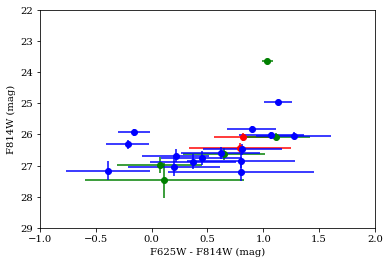

In [8]:
F625W_F1 = infoF1[:,41]
xerr2_F1 = np.sqrt(infoF1[:,43]**2 + infoF1[:,56]**2)
F814W_F1 = infoF1[:,54]
yerr2_F1 = infoF1[:,56]

F625W_F2 = infoF2[:,41]
xerr2_F2 = np.sqrt(infoF2[:,43]**2 + infoF2[:,56]**2)
F814W_F2 = infoF2[:,54]
yerr2_F2 = infoF2[:,56]

F625W_F3 = infoF3[:,41]
xerr2_F3 = np.sqrt(infoF3[:,43]**2 + infoF3[:,56]**2)
F814W_F3 = infoF3[:,54]
yerr2_F3 = infoF3[:,56]

line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)

#plt.plot(F625W_F1 - F814W_F1, F814W_F1, 'ro', F625W_F2 - F814W_F2, F814W_F2, 'go', F625W_F3 - F814W_F3, F814W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F625W - F814W (mag)')
plt.ylabel('F814W (mag)')
plt.axis([-1,2,29,22])

In [9]:
import os
import glob
import matplotlib as mpl

mist_dir = Iax_dir + "/MIST_v1.0_HST_ACSWF"
# All of this MIST isochrone code comes from Asher

In [10]:
kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "log_Teff", "log_g",
                    "log_L", "z_surf", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", 
                    "ACS_WFC_F658N", "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W",
                    "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    feh_string = filename.split("/")[-1].split("_")[3] # Pulls metalicity information
    if feh_string[0] == "p":
        feh = float(feh_string[1:]) # feh is [Fe/H]
    elif feh_string[0] == "m":
        feh = -float(feh_string[1:])
    else:
        raise ValueError
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [11]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(21.81e6 - 1.53e6) - 1)
dist_upper = 5 * (np.log10(21.81e6 + 1.53e6) - 1)
red_lower = 0
red_upper = 0
metal_lower = -0.50
metal_upper = -0.50

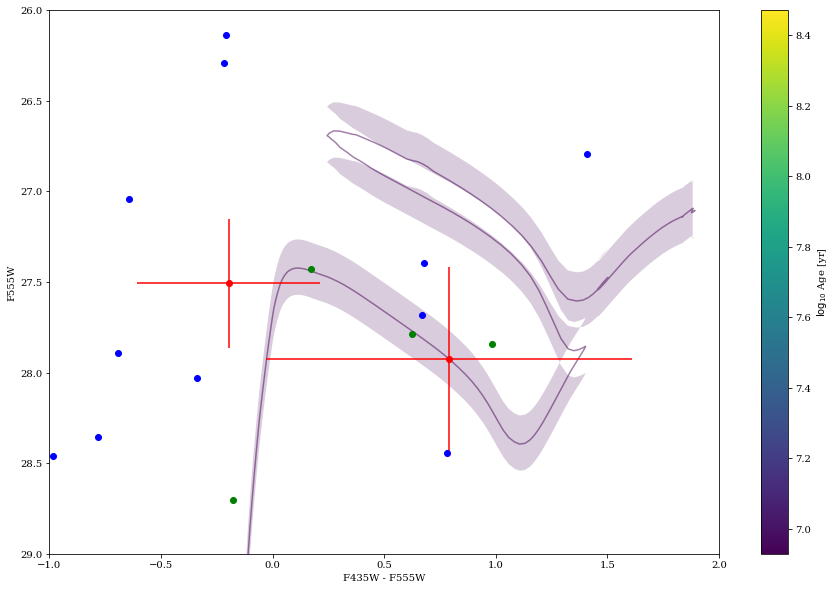

In [12]:
# fix metallicity, vary age
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.7) & (ages < 7.75)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(21.81e6) - 1)
    F435W_ext = 0.283 # extinction in F435W in UGC 12682 from NED
    F555W_ext = 0.219 # extinction in F555W in UGC 12682 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    #plt.plot(color, mag_lower, 'grey', color, mag_upper, 'grey', alpha=0.3)
    
# Plots stars
line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
#line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line2 = plt.plot(F435W_F2 - F555W_F2, F555W_F2, 'go')
#line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)
line3 = plt.plot(F435W_F3 - F555W_F3, F555W_F3, 'bo')
# Plots reddening vector
#plt.arrow(-1, 24.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(29,26)
plt.xlim(-1, 2)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

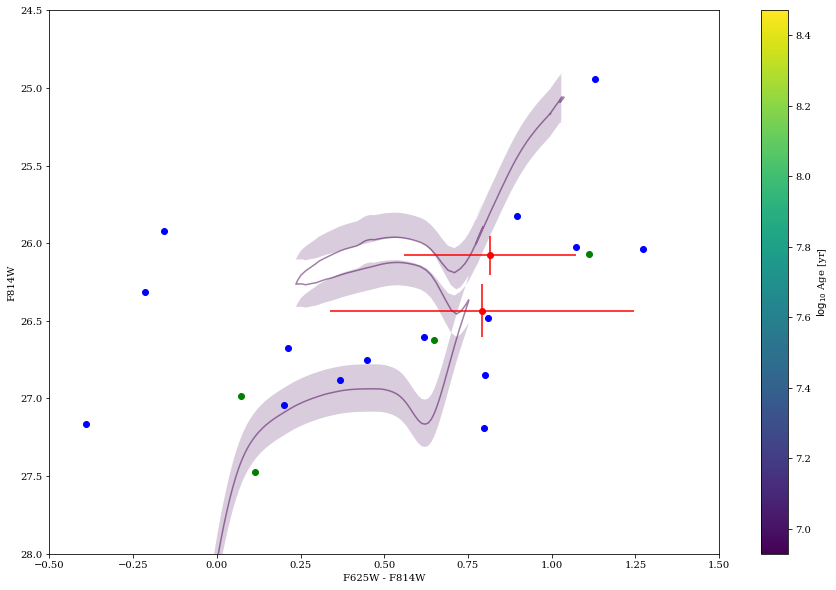

In [13]:
# fix metallicity, vary age
df = isochrones[-0.50]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.7) & (ages < 7.75)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
#line2 = plt.errorbar(F625W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line2 = plt.plot(F625W_F2 - F814W_F2, F814W_F2, 'go')
#line3 = plt.errorbar(F625W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)
line3 = plt.plot(F625W_F3 - F814W_F3, F814W_F3, 'bo')

# Plots reddening vector
plt.arrow(-0.5, 23.5, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(28,24.5)
plt.xlim(-.5, 1.5)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

# Removing clusters

In [14]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/images/sn2008ha/sn2008ha_f625w_lacosmic.fits.mag.1")
ascii_2 = open(Iax_dir + "/images/sn2008ha/sn2008ha_f625w_lacosmic.fits.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(32)
for i in range(32):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [15]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_200pc.reg", "r+")
text = asci.readlines()

region = np.zeros([32,2])
for i in range(32):
    A = mysplit(text[i+3], ' # ')
    region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]

# Info for each star chosen as real 
info = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        info[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

(30, 24)

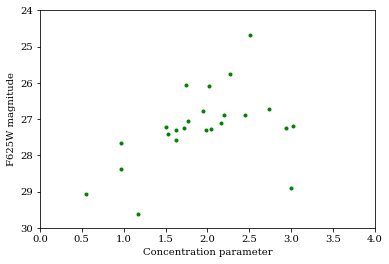

In [16]:
# Plots the concentration parameter vs magnitude
plt.plot(concentration, info[:,41], 'g.')
plt.xlabel('Concentration parameter')
plt.ylabel('F625W magnitude')
plt.xlim(0,4)
plt.ylim(30,24)

In [17]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
new_info = np.zeros(info.shape)
for i in range(32):
    if (concentration[i] < 2.3): # & (concentration[i] >= 0):
        new_info[i] = info[i]
new_info = new_info[~np.all(new_info == 0, axis=1)]

In [18]:
np.savetxt("Region_files/sn2008ha_NoClustersROI.reg", new_info[:,2:4], '%5.2f')

In [19]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_NoClustersROI_133pc.reg", "r+")
text = asci.readlines()
region = np.zeros([32,2])

for i in range(9):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

new_info1 = np.copy(new_info) # Will hold stars within 200 parsecs
new_info2 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 133 parsecs
new_info3 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 67 parsecs

j = 0 # Iteration variable for region array
for i in range(new_info.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info[i][2])&(region[j][1] == new_info[i][3]):
        new_info2[j] = new_info[i]
        j = j + 1
        if j == region.shape[0]: break

asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_NoClustersROI_67pc.reg", "r+")
text = asci.readlines()
region = np.zeros([9,2])

for i in range(1):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]


j = 0 # Iteration variable for region array
for i in range(new_info1.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info1[i][2])&(region[j][1] == new_info1[i][3]):
        new_info3[j] = new_info1[i]
        j = j + 1
        if j == region.shape[0]: break
                
                
for i in range(new_info1.shape[0]):
    for j in range(new_info2.shape[0]):
        if np.array_equal(new_info1[i],new_info2[j]):
            new_info1[i] = np.zeros(new_info1[i].size)
for i in range(new_info2.shape[0]):
    for j in range(new_info3.shape[0]):
        if np.array_equal(new_info2[i],new_info3[j]):
            new_info2[i] = np.zeros(new_info2[i].size)
            
new_info1 = new_info1[~np.all(new_info1 == 0, axis=1)]
new_info2 = new_info2[~np.all(new_info2 == 0, axis=1)]
new_info3 = new_info3[~np.all(new_info3 == 0, axis=1)]

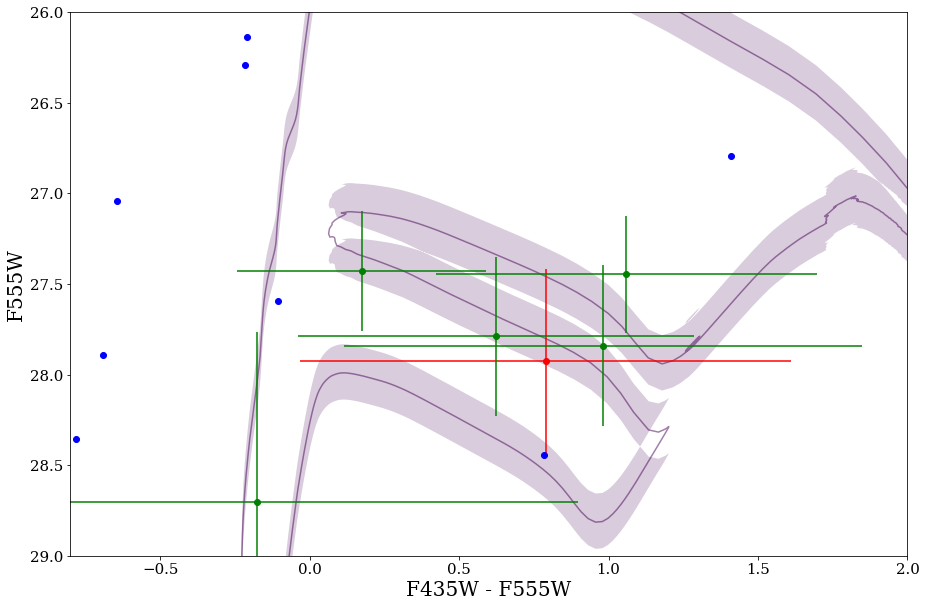

In [20]:
# fix metallicity, vary age
df = isochrones[-0.75]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.84) & (ages < 7.86)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(21.81e6) - 1)
    F435W_ext = 0.283 # extinction in F435W in UGC 12682 from NED
    F555W_ext = 0.219 # extinction in F555W in UGC 12682 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)
    
norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,15] - new_info3[:,28], new_info3[:,28], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,17]**2 + new_info3[:,30]**2), yerr=new_info3[:,30])
line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
#line2 = plt.plot(new_info2[:,15] - new_info2[:,28], new_info2[:,28], 'go')
#line3 = plt.errorbar(new_info[:,15] - new_info[:,28], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,17]**2 + new_info[:,30]**2), yerr=new_info[:,30])
line3 = plt.plot(new_info1[:,15] - new_info1[:,28], new_info1[:,28], 'bo')
#line4 = plt.plot(False_stars[:,2] - False_stars[:,3], False_stars[:,3], 'mp')

plt.xlabel("F435W - F555W", fontsize=20)
plt.ylabel("F555W", fontsize=20)
plt.ylim(29,26)
plt.xlim(-.8, 2)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.draw()
plt.show()

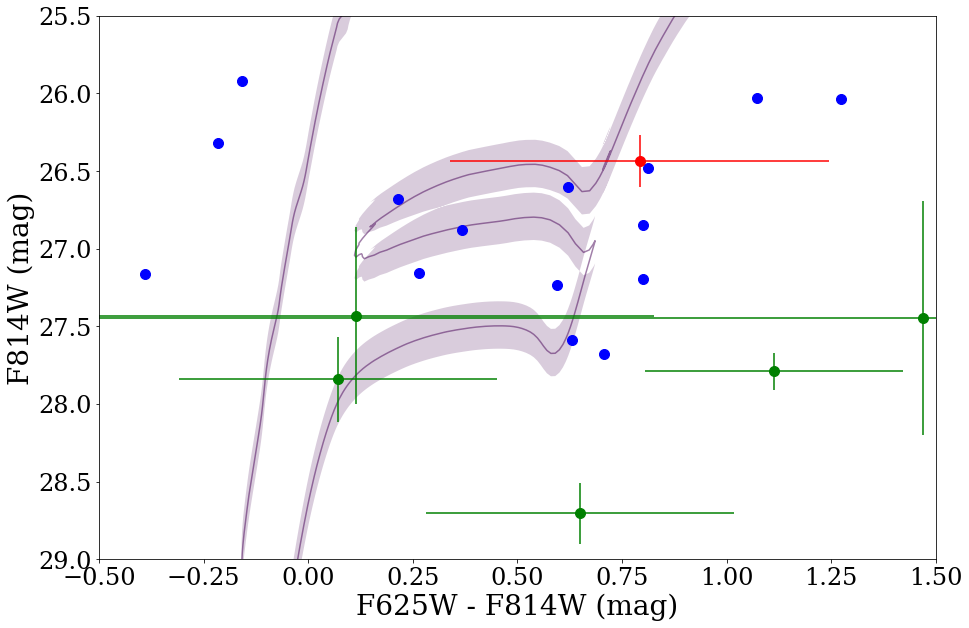

In [21]:
# fix metallicity, vary age
df = isochrones[-0.75]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.84) & (ages < 7.86)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
line1 = plt.errorbar(new_info3[:,41] - new_info3[:,54], new_info3[:,54], fmt='ro', 
                     xerr=np.sqrt(new_info3[:,43]**2 + new_info3[:,56]**2), yerr=new_info3[:,56], markersize=10)
line2 = plt.errorbar(new_info2[:,41] - new_info2[:,54], new_info2[:,28], fmt='go', 
                     xerr=np.sqrt(new_info2[:,43]**2 + new_info2[:,56]**2), yerr=new_info2[:,56], markersize=10)
#line2 = plt.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'go')
#line3 = plt.errorbar(new_info[:,41] - new_info[:,54], new_info[:,28], fmt='bo', 
#                     xerr=np.sqrt(new_info[:,43]**2 + new_info[:,56]**2), yerr=new_info[:,56])
line3 = plt.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'bo', markersize=10)
#line4 = plt.plot(False_stars[:,4] - False_stars[:,5], False_stars[:,5], 'mp')


plt.xlabel("F625W - F814W (mag)", fontsize=28)
plt.ylabel("F814W (mag)", fontsize=28)
plt.ylim(29,25.5)
plt.xlim(-.5, 1.5)
plt.tick_params(axis='both', which='major', labelsize=24)

# Crappy Chi-squared Test

First, we weight stars in the Crappy Chi-squared by assuming a characteristic velocity dispersion for an open cluster and using it to get a radial probability distribution (i.e. probability of stars at some physical distance from the SN position of being coincident in age with SN progenitor).

There are  5.0 stars above signal-to-noise of 10, and  10.0 stars below.


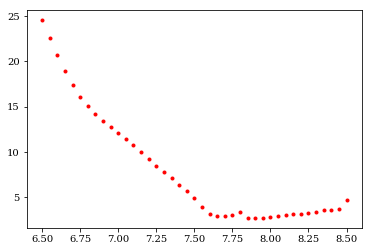

In [22]:
# Reruns through the isochrones the user specifies to get mags, colors, etc.
df = isochrones[-1.00]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
ages = ages[(ages >= 6.5) & (ages <= 8.5)]

for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*Gal_ext
    mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*Gal_ext
    mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    age_cmd[age] = (mag_435, mag_555, mag_625, mag_814) #(color, mag, mag_lower, mag_upper)
n_ages = i + 1


SN_pos = np.array([1720.34, 3177.13])

CChi = np.zeros([2,n_ages]) # This is the array which measure crappy chi-squared across all filters
k = 0
n10SN = 0
nlow = 0
for age, (mag_435, mag_555, mag_625, mag_814) in age_cmd.items():
    phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
    temp = 0 # This will hold the distance for each data point to the line
    
    # Sets the radial dispersion for the region
    sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(21.81e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
    flat = (100 * 206265)/(21.81e6 * .05) # 100 parsecs in pixels
    flat_int = int(np.round(flat*5))
    for j in range(new_info.shape[0]):
        # Removes "stars" with mag > 90 in any band
        if (new_info[j,15] > 90) or (new_info[j,28] > 90) or (new_info[j,41] > 90) or (new_info[j,54] > 90):
            continue
        if new_info[j,5] >= 10:
            n10SN += 1
        else: nlow += 1
        
        # Uses physical distance between star and SN position to weight each star
        phys_dist = np.sqrt((SN_pos[0] - new_info[j,2])**2 + (SN_pos[1] - new_info[j,3])**2)
        weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
               np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
        phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
        phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
        # Adds the difference in mags for each data point in quadrature.
        #temp += phys_dist_weight * np.amin((new_info[j,15] - mag_435)**2/mag_435 + (new_info[j,28] - mag_555)**2/mag_555
        #                + (new_info[j,41] - mag_625)**2/mag_625 + (new_info[j,54] - mag_814)**2/mag_814)
        temp += (phys_dist_weight * np.amin(np.sqrt((new_info[j,15] - mag_435)**2
          + (new_info[j,28] - mag_555)**2 + (new_info[j,41] - mag_625)**2 + (new_info[j,54] - mag_814)**2)))**2
    
    # There are eleven stars removed not counted, as they have >90 mag in some filter
    phys_dist_temp /= (new_info.shape[0] - 11)
    CChi[0,k] = age
    CChi[1,k] = np.sqrt(temp)/phys_dist_temp
    k = k + 1
    
# Ensures that the crappy chi-squared arrays are ordered by age for convenience.
CChi = CChi.T[CChi.T[:,0].argsort()]
plt.plot(CChi.T[0], CChi.T[1], 'r.')
print("There are ", n10SN/n_ages, "stars above signal-to-noise of 10, and ", nlow/n_ages, "stars below.")

Now, we Monte Carlo false stars by sampling the IMF and radial distributions, and using the Isochrones to get false Crappy Chi-squared statistics.

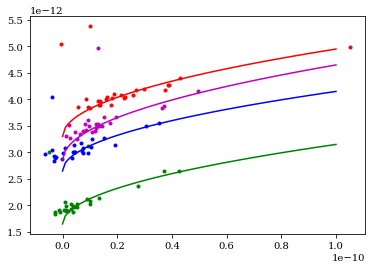

In [22]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 1e-10, num=100)

plt.plot(new_info[:,13], new_info[:,14], 'g.')
plt.plot(x_array, 1.65e-12 + 1.5e-7*np.sqrt(x_array), 'g-')
plt.plot(new_info[:,26], new_info[:,27], 'b.')
plt.plot(x_array, 2.65e-12 + 1.5e-7*np.sqrt(x_array), 'b-')
plt.plot(new_info[:,39], new_info[:,40], 'm.')
plt.plot(x_array, 2.85e-12 + 1.8e-7*np.sqrt(x_array), 'm-')
plt.plot(new_info[:,52], new_info[:,53], 'r.')
plt.plot(x_array, 3.3e-12 + 1.65e-7*np.sqrt(x_array), 'r-')

In [79]:
# For now, setup Salpeter IMF, because it's less likely to fail than Kroupa.
def SalpeterUnNorm(m):
    return m**-2.35
def invSalpeter(u, lower, upper):
    norm = integrate.quad(SalpeterUnNorm, lower, upper)[0]
    return (lower**(-1.35) - 1.35 * norm * u)**(-1/1.35)

In [22]:
# Now, replace the fitting functions (previously polynomials) with skew normal distributions
from scipy.optimize import curve_fit
from scipy.stats import skewnorm

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

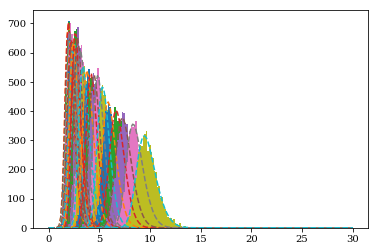

In [35]:
# This cell and the one below are for a full run fit in magnitudes, using [FeH]=-.75
x = np.linspace(0,30,200)
probs1 = []
for i, age in enumerate(ages):
    filename="MC_08ha_MagFit_[FeH]=-.75/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs1.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,30,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs1.append(skew(CChi[i,1], *popt)/norm)

7.6 3.02455651264


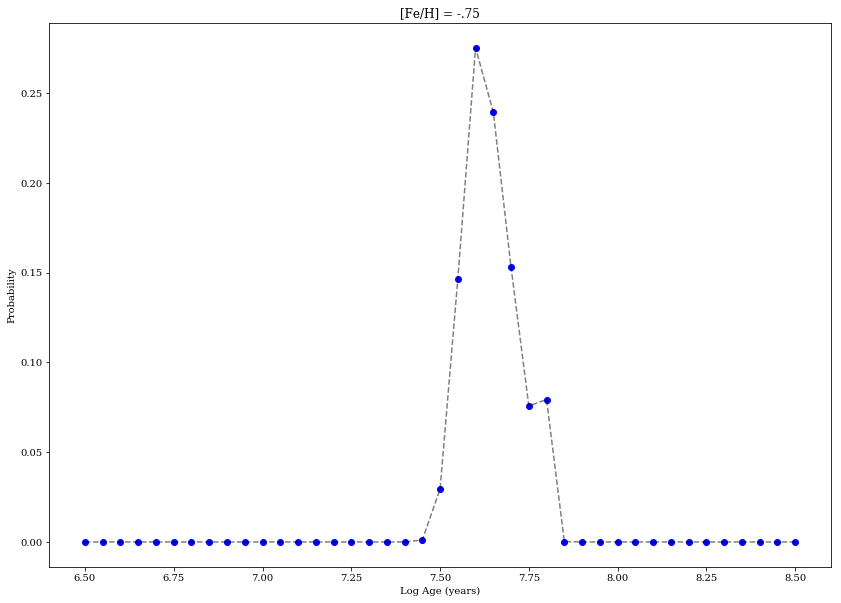

In [36]:
norm1 = np.sum(probs1)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs1/norm1, 'bo')
plt.plot(CChi[:,0], probs1/norm1, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("[Fe/H] = -.75")
print(CChi[:,0][np.argmax(probs1)], norm1)

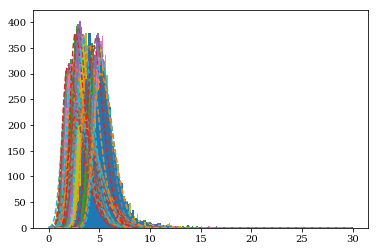

In [38]:
# This cell and the one below are for a full run fit in magnitudes, with higher metallicity
x = np.linspace(0,30,200)
probs2 = []
for i, age in enumerate(ages):
    filename="MC_08ha_MagFit_[FeH]=-.50/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs2.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,30,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs2.append(skew(CChi[i,1], *popt)/norm)

7.85 4.71402036821


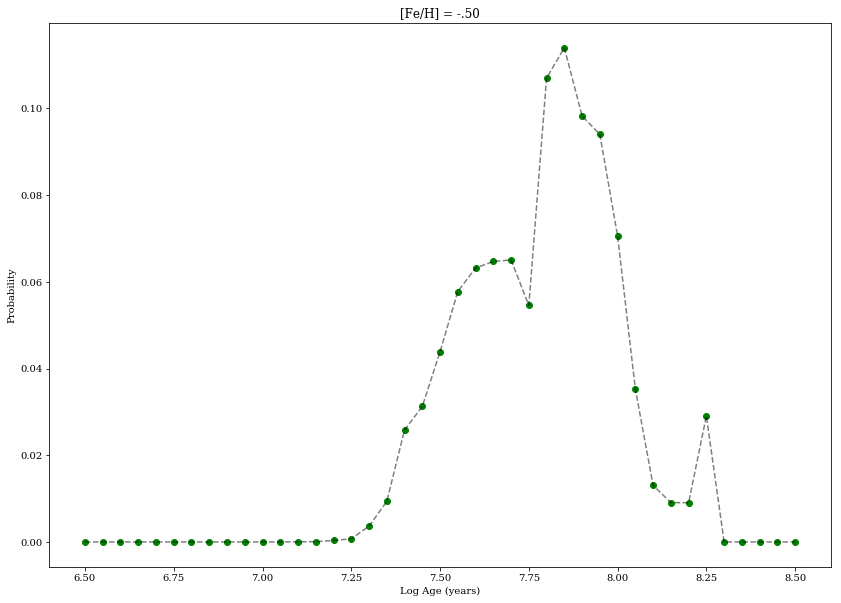

In [39]:
norm2 = np.sum(probs2)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs2/norm2, 'go')
plt.plot(CChi[:,0], probs2/norm2, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("[Fe/H] = -.50")
print(CChi[:,0][np.argmax(probs2)], norm2)

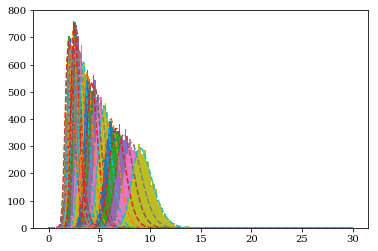

In [41]:
# This cell and the one below are for a full run fit in magnitudes, with lower metallicity
x = np.linspace(0,30,200)
probs3 = []
for i, age in enumerate(ages):
    filename="MC_08ha_MagFit_[FeH]=-1.00/CChi_false_{Age}.npy".format(Age=np.round(age,decimals=2))
    CChi_false = np.load(filename)
    CChi_false[1,:] = CChi_false[1,:]
    halt = False
    for j in range(5000):
        if np.isinf(CChi_false[1,j]):
            CChi_false[1,j] = 999999999999
            halt = True
            continue
    if halt == True:
        probs3.append(0)
        continue
    y = plt.hist(CChi_false[1,:], bins=np.linspace(0,30,201))[0]
    popt, pcov = curve_fit(skew, x, y, p0=(2000, 3, 2, 2))
    plt.plot(x, skew(x, *popt), '--')
    norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
    probs3.append(skew(CChi[i,1], *popt)/norm)

7.65 2.20865403023


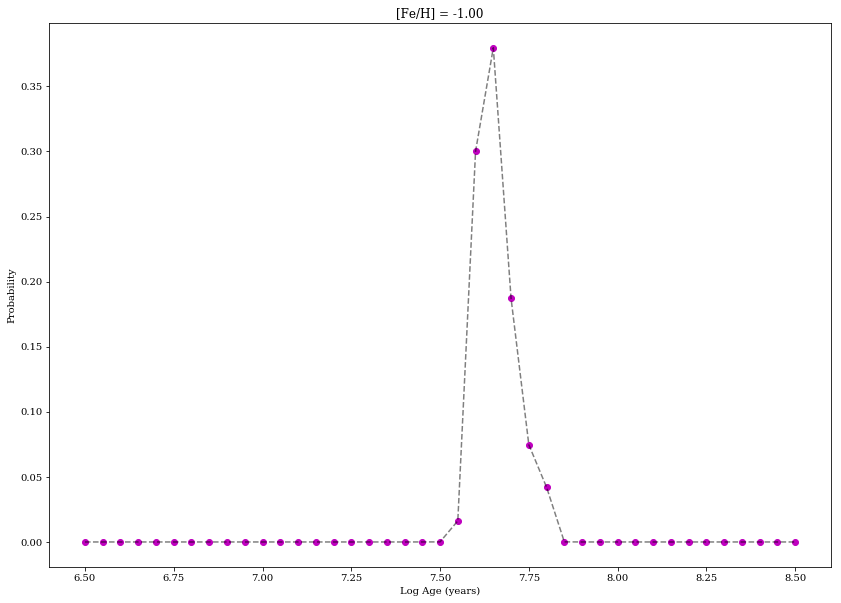

In [42]:
norm3 = np.sum(probs3)
plt.figure(figsize=(14,10));
plt.plot(CChi[:,0], probs3/norm3, 'mo')
plt.plot(CChi[:,0], probs3/norm3, 'k--', alpha=.5)
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.title("[Fe/H] = -1.00")
print(CChi[:,0][np.argmax(probs3)], norm3)

3.02455651264 4.71402036821 2.20865403023


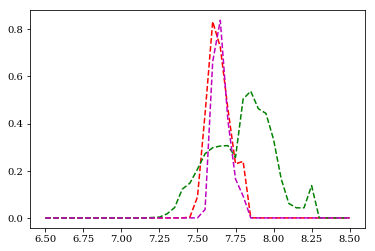

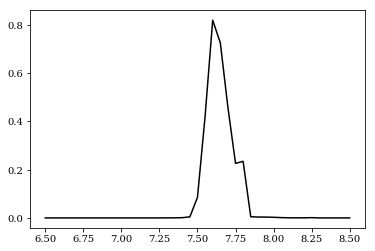

In [43]:
# Combining the probabilities
plt.plot(CChi[:,0], probs1, 'r--', CChi[:,0], probs2, 'g--', CChi[:,0], probs3, 'm--')
print(norm1, norm2, norm3)
plt.show()

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
probs_tot = (np.array(probs1) * norm(-.75) + np.array(probs2) * norm(-.5) + np.array(probs3) * norm(-1.00))/(norm(-.75) + norm(-.5) + norm(-1.00))
plt.plot(CChi[:,0], probs_tot, 'k')
plt.show()

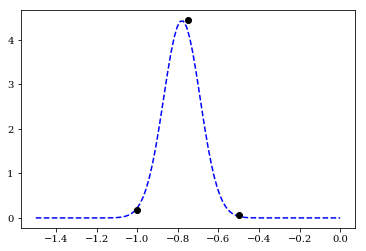

In [44]:
# Compare posterior in metallicity to prior
x_array = np.linspace(-1.5,0,100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')

plt.plot([-1,-.75,-.5], [.35*norm3*norm(-1.00), .35*norm1*norm(-.75), .35*norm2*norm(-.50)], 'ko')

## Using new data structures

In [29]:
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [ ]:
metallicity = np.array([-.96, -.87, -.78, -.69, -.60])
reddening = np.array([0])
SN_pos = np.array([1720.34, 3177.13])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
CChi_temp = np.zeros([2,1])


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*Gal_ext
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*Gal_ext
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(21.81e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(21.81e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(new_info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (new_info[l,15] > 90) or (new_info[l,28] > 90) or (new_info[l,41] > 90) or (new_info[l,54] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - new_info[l,2])**2 + (SN_pos[1] - new_info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((new_info[l,15] - mag_435)**2
                  + (new_info[l,28] - mag_555)**2 + (new_info[l,41] - mag_625)**2 + (new_info[l,54] - mag_814)**2)))**2
    
            # There are eleven stars removed not counted, as they have >90 mag in some filter
            phys_dist_temp /= (new_info.shape[0] - 11)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [ ]:
x = np.linspace(0,30,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_08ha_All/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    continue
            if halt == True:
                probs[k,j,i] = 0
            y = plt.hist(CChi_false[k,j,i,0,:], bins=np.linspace(0,30,201))[0]
            popt, pcov = curve_fit(skew, x, y, p0=popt)
            norm = integrate.quad(skew, 0, 30, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

KeyboardInterrupt: 

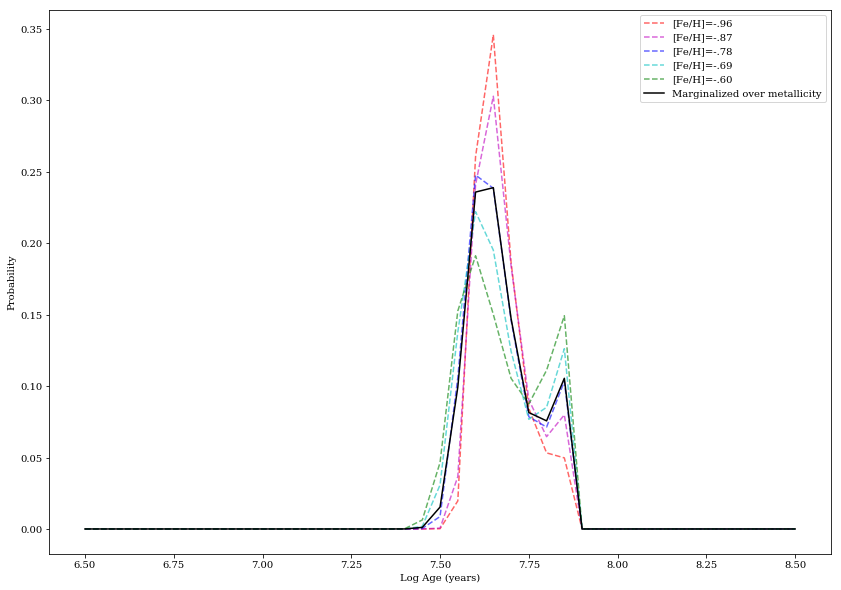

7.65


In [89]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', alpha=.6, label='[Fe/H]=-.96')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', alpha=.6, label='[Fe/H]=-.87')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', alpha=.6, label='[Fe/H]=-.78')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', alpha=.6, label='[Fe/H]=-.69')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', alpha=.6, label='[Fe/H]=-.60')

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs[0,0,:] * norm(-.96) + probs[1,0,:] * norm(-.87) + probs[2,0,:] * norm(-.78) + 
            probs[3,0,:] * norm(-.69) + probs[4,0,:] * norm(-.60))/(
            norm(-.96) + norm(-.87) + norm(-.78) + norm(-.69) + norm(-.60))
plt.plot(CChi[0,0,:,3,0], probs_tot/np.sum(probs_tot), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
sa
print(CChi[0,0,:,3,0][np.argmax(probs_tot)])
np.save("Region_files/10el_Mag_probs", probs_tot)

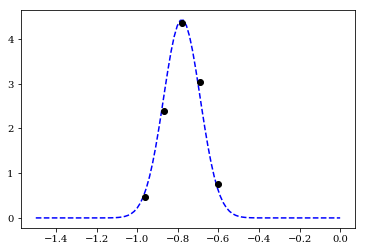

In [51]:
# Compare posterior in metallicity to prior
x_array = np.linspace(-1.5,0,100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')

plt.plot([-.96, -.87, -.78, -.69, -.60], [.315*np.sum(probs[0,0,:])*norm(-.96), .315*np.sum(probs[1,0,:])*norm(-.87),
                                          .315*np.sum(probs[2,0,:])*norm(-.78), .315*np.sum(probs[3,0,:])*norm(-.69),
                                          .315*np.sum(probs[4,0,:])*norm(-.60)], 'ko')

## Attempting to make some subplots

In [60]:
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.64) & (ages < 7.66)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')

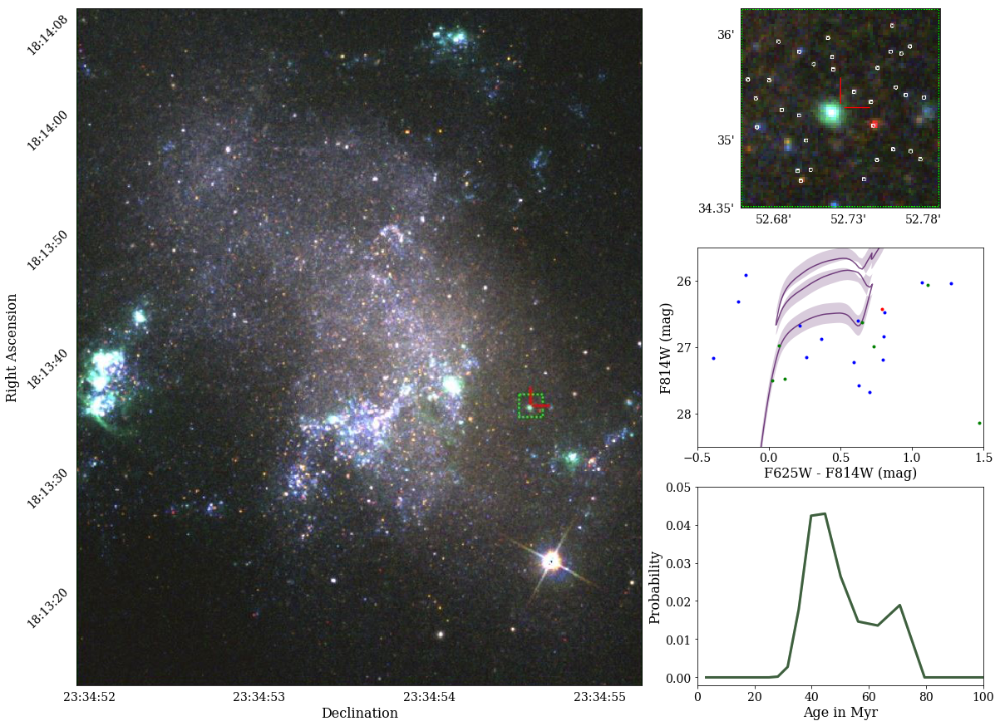

In [91]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.12, hspace=0.2)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2008ha_5kpc.6kpc.JPG')
ax0.imshow(image)
# Setting the ticks
x_tick = 663/(55.39 - 52.07)
x_start = x_tick*.07
ax0.set_xticks([x_start, x_start + x_tick, x_start + 2*x_tick, x_start + 3*x_tick])
ax0.set_xticklabels(['23:34:52', '23:34:53', '23:34:54', '23:34:55'], **tick_font)
y_tick = 795/(68.59 - 11.92)
y_start = y_tick*8.59
ax0.set_yticks([0.59*y_tick, y_start, y_start + 10*y_tick, y_start + 20*y_tick,
                y_start + 30*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['18:14:08', '18:14:00', '18:13:50', '18:13:40', '18:13:30', '18:13:20'], rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2008ha_400pc.400pc.JPG')
ax1.imshow(image)
# Setting the ticks
x_tick = 767/(52.791 - 52.658)
x_start = x_tick*.022
ax1.set_xticks([x_start, x_start + .05*x_tick, x_start + .10*x_tick])
ax1.set_xticklabels(["52.68'", "52.73'", "52.78'"], **tick_font) # Append 23:34 to front for full coords
y_tick = 769/(36.24 - 34.35)
y_start = y_tick*.24
ax1.set_yticks([y_start, y_start + y_tick, y_start + (2-.35)*y_tick])
ax1.set_yticklabels(["36'", "35'", "34.35'"], **tick_font) # Append 18:13 for full coords
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'b.')
line2 = ax2.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,54], 'g.')
line3 = ax2.plot(new_info3[:,41] - new_info3[:,54], new_info3[:,54], 'r.')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.1)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(28.5,25.5)
ax2.set_xlim(-.5, 1.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(26, 29))
ax2.set_xticks(np.arange(-.50,2,.5))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.1)
ax3.yaxis.set_label_coords(-.12, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .06, .01));

plt.savefig('2008ha_Fig.pdf', dpi=1000)

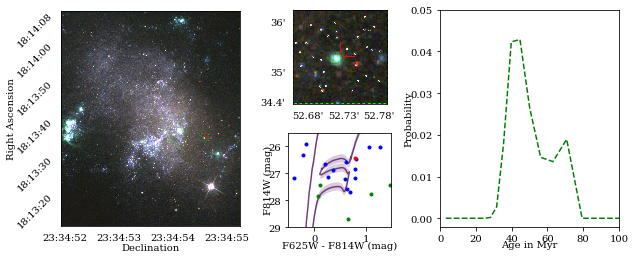

In [53]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(10,4))
gs = gridspec.GridSpec(2, 8)
gs.update(wspace=1.8, hspace=0.3)

ax0 = plt.subplot(gs[:, :3])
image=im.imread(Iax_dir + '/Iax_Pictures/2008ha_5kpc.6kpc.JPG')
ax0.imshow(image)
x_tick = 663/(55.39 - 52.07)
x_start = x_tick*.07
ax0.set_xticks([x_start, x_start + x_tick, x_start + 2*x_tick, x_start + 3*x_tick])
ax0.set_xticklabels(['23:34:52', '23:34:53', '23:34:54', '23:34:55'])
y_tick = 795/(68.59 - 11.92)
y_start = y_tick*8.59
ax0.set_yticks([0.59*y_tick, y_start, y_start + 10*y_tick, y_start + 20*y_tick,
                y_start + 30*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['18:14:08', '18:14:00', '18:13:50', '18:13:40', '18:13:30', '18:13:20'], rotation=45)
ax0.set_xlabel("Declination")
ax0.set_ylabel("Right Ascension")
ax0.xaxis.set_label_coords(.5, -.08)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.25, .5)
ax0.yaxis.set_ticks_position('none')

ax1 = plt.subplot(gs[0,3:5])
image=im.imread(Iax_dir + '/Iax_Pictures/2008ha_400pc.400pc.JPG')
ax1.imshow(image)
x_tick = 767/(52.791 - 52.658)
x_start = x_tick*.022
ax1.set_xticks([x_start, x_start + .05*x_tick, x_start + .10*x_tick])
ax1.set_xticklabels(["52.68'", "52.73'", "52.78'"]) # Append 23:34 to front for full coords
y_tick = 769/(36.24 - 34.35)
y_start = y_tick*.24
ax1.set_yticks([y_start, y_start + y_tick, y_start + (2-.4)*y_tick])
ax1.set_yticklabels(["36'", "35'", "34.4'"]) # Append 18:13 for full coords
ax1.xaxis.set_label_coords(.5, -.15)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.25, .5)
ax1.yaxis.set_ticks_position('none')

ax2 = plt.subplot(gs[-1,3:5])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,41] - new_info1[:,54], new_info1[:,54], 'b.')
line2 = ax2.plot(new_info2[:,41] - new_info2[:,54], new_info2[:,28], 'g.')
line3 = ax2.plot(new_info3[:,41] - new_info3[:,54], new_info3[:,54], 'r.')
ax2.set_xlabel("F625W - F814W (mag)")
ax2.set_ylabel("F814W (mag)")
ax2.xaxis.set_label_coords(.5, -.15)
ax2.yaxis.set_label_coords(-.15, .5)
ax2.set_ylim(29,25.5)
ax2.set_xlim(-.5, 1.5)
ax2.set_yticks(np.arange(26, 30))

ax3 = plt.subplot(gs[:,5:])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g--')
ax3.set_xlabel("Age in Myr")
ax3.set_ylabel("Probability")
ax3.xaxis.set_label_coords(.5, -.06)
ax3.yaxis.set_label_coords(-.15, .5)
ax3.set_xlim(0,100)
ax3.set_yticks(np.arange(0, .06, .01));

#plt.savefig('grid_figure.pdf')

## Now, load in my DOLPHOT output, and compare

In [18]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog_new = np.loadtxt(Iax_dir+"/new_files/sn2008ha/sn2008ha") #sn2008ha_All_ACS")

In [19]:
pos_predict_new = np.zeros((catalog_new.shape[0],2))
info_predict_new = np.zeros(np.shape(catalog_new))

j = 0 # Iteration variable for positions array
for i in range(catalog_new.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if 0 < 1: #((catalog_new[i][5] >= 3)&(abs(catalog_new[i][6]) < .3)&(abs(catalog_new[i][7]) < 1)
        #&(catalog_new[i][9] < .1)):
        pos_predict_new[j][0] = catalog_new[i][2] # Assigns X position
        pos_predict_new[j][1] = catalog_new[i][3] # Assigns Y position
        info_predict_new[j] = catalog_new[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_new = pos_predict_new[~np.all(pos_predict_new == 0, axis=1)]
info_predict_new = info_predict_new[~np.all(info_predict_new == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2008ha_Prediction_new2.reg", pos_predict_new, '%5.2f')

In [20]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_200pc_new2.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([22,2])
for i in range(22):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_new = np.zeros([region.shape[0],info_predict_new.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_new.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_new[i][0])&(region[j][1] == pos_predict_new[i][1]):
        info_new[j] = info_predict_new[i]
        j = j + 1
        if j == region.shape[0]: break

In [21]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2008ha/sn2008ha_f625w_crc1.mag.1")
ascii_2 = open(Iax_dir + "/new_files/sn2008ha/sn2008ha_f625w_crc1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(22)
for i in range(22):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

(-2, -8)

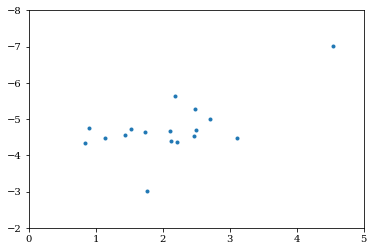

In [22]:
plt.plot(concentration, info_new[:,41] - 5*(np.log10(21.3e6) - 1), '.')
plt.xlim(0,5)
plt.ylim(-2,-8)

In [23]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info = np.zeros(info_new.shape)
for i in range(22):
    if (concentration[i] < 3.5): #2.3):
        info[i] = info_new[i]
info = info[~np.all(info == 0, axis=1)]

np.savetxt("Region_files/sn2008ha_NoClustersROI_new2.reg", info[:,2:4], '%5.2f')

In [24]:
print(info.shape)

(21, 271)


In [25]:
import matplotlib as mpl
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [26]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(21.81e6 - 1.53e6) - 1)
dist_upper = 5 * (np.log10(21.81e6 + 1.53e6) - 1)
red_lower = 0
red_upper = 0
metal_lower = -0.50
metal_upper = -0.50

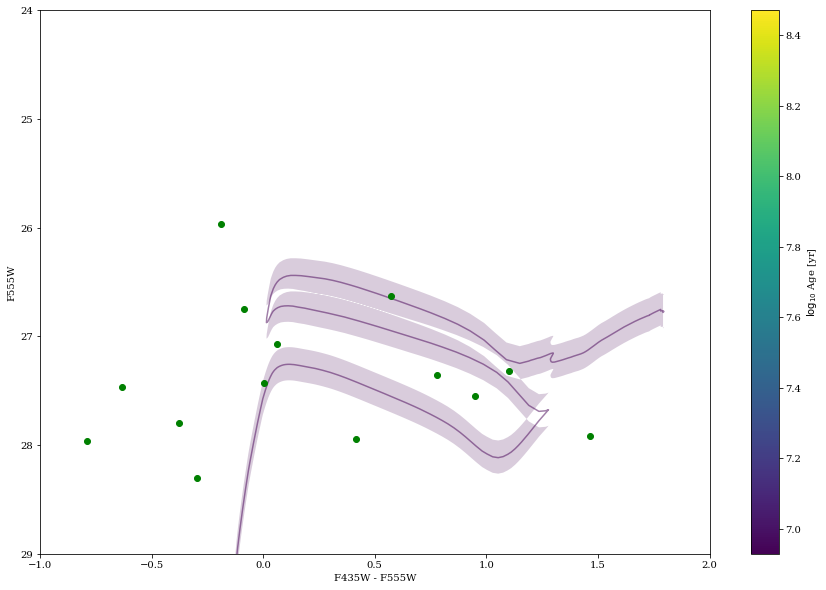

In [27]:
# fix metallicity, vary age
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.69) & (ages < 7.71)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(21.81e6) - 1)
    F435W_ext = 0.283 # extinction in F435W in UGC 12682 from NED
    F555W_ext = 0.219 # extinction in F555W in UGC 12682 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.plot(info[:,15] - info[:,28], info[:,28], 'go')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(29,24)
plt.xlim(-1, 2)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

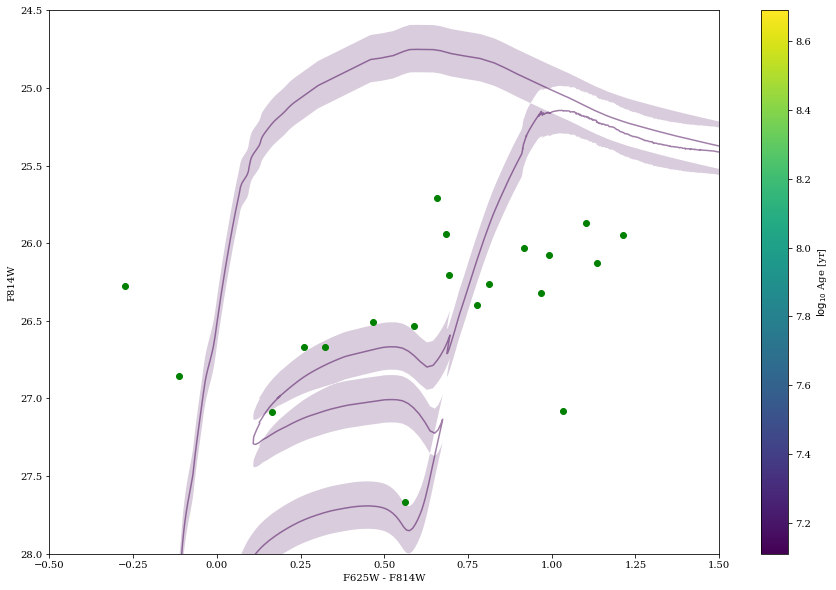

In [28]:
# fix metallicity, vary age
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.89) & (ages < 7.91)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.plot(info[:,41] - info[:,54], info[:,54], 'go')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(28,24.5)
plt.xlim(-.5, 1.5)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

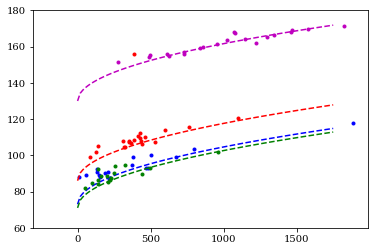

In [29]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 1750, num=100)

plt.plot(info[:,11], info[:,17]/1.0857 * info[:,11], 'b.')
plt.plot(x_array, 73 + np.sqrt(x_array), 'b--')
plt.plot(info[:,24], info[:,30]/1.0857 * info[:,24], 'g.')
plt.plot(x_array, 71 + np.sqrt(x_array), 'g--')
plt.plot(info[:,37], info[:,43]/1.0857 * info[:,37], 'r.')
plt.plot(x_array, 86 + np.sqrt(x_array), 'r--')
plt.plot(info[:,50], info[:,56]/1.0857 * info[:,50], 'm.')
plt.plot(x_array, 130 + np.sqrt(x_array), 'm--')
plt.ylim(60,180)
plt.show()

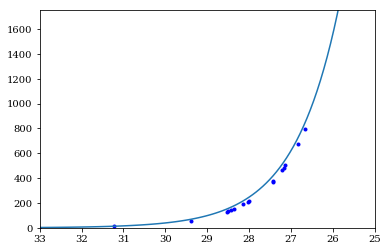

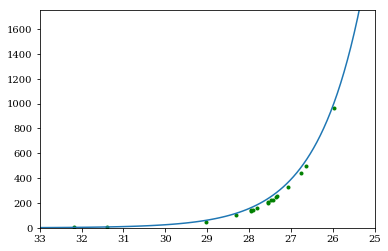

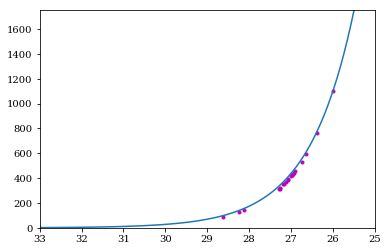

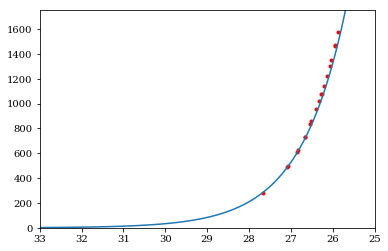

In [30]:
x_array = np.linspace(25,33,100)
plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,15], info[:,11], 'b.')
plt.plot(x_array, 1.65*1164 * 10**((25.769 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,28], info[:,24], 'g.')
plt.plot(x_array, 1.65*764 * 10**((25.722 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,41], info[:,37], 'm.')
plt.plot(x_array, 1.65*840 * 10**((25.743 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,54], info[:,50], 'r.')
plt.plot(x_array, 1.65*1240 * 10**((25.525 - x_array)/2.5))
plt.show()

In [37]:
metallicity = np.array([-.96, -.87, -.78, -.69, -.60])
reddening = np.array([0])
SN_pos = np.array([1690.202, 3180.5413])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
CChi_temp = np.zeros([2,1])


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*red
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*red
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*red
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(21.81e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(21.81e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (info[l,15] > 90) or (info[l,28] > 90) or (info[l,41] > 90) or (info[l,54] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info[l,2])**2 + (SN_pos[1] - info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info[l,15] - mag_435)**2
                  + (info[l,28] - mag_555)**2 + (info[l,41] - mag_625)**2 + (info[l,54] - mag_814)**2)))**2
    
            # There are six stars not counted, as they have >90 mag in some filter
            phys_dist_temp /= (info.shape[0] - 6) #4)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

In [32]:
# Now, replace the fitting functions (previously polynomials) with skew normal distributions
from scipy.optimize import curve_fit
from scipy.stats import skewnorm

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

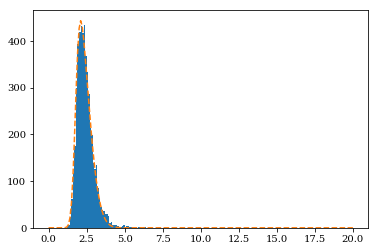

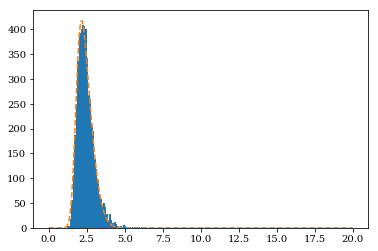

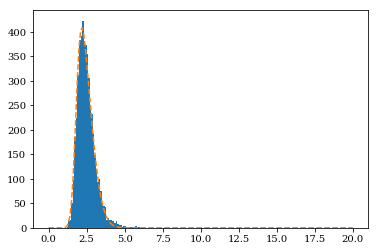

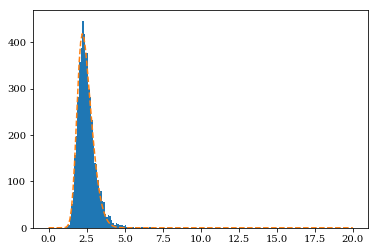

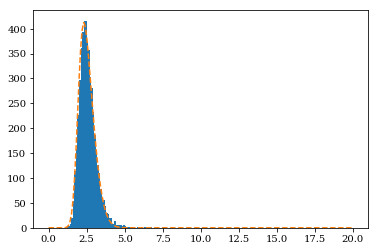

...

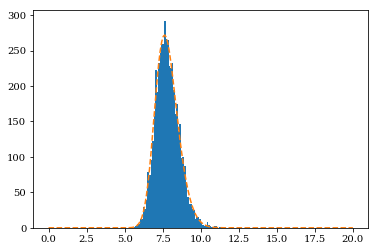

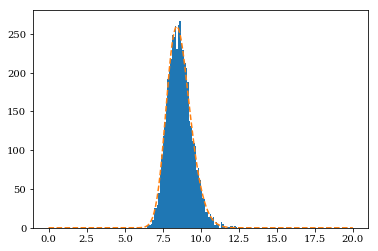

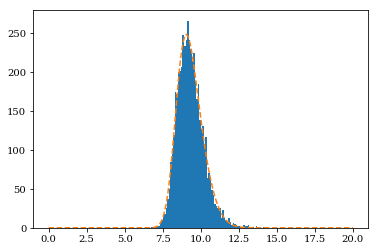

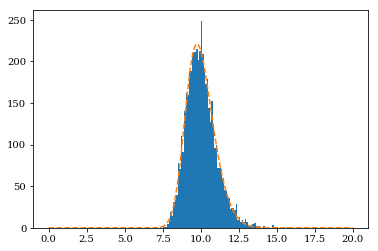

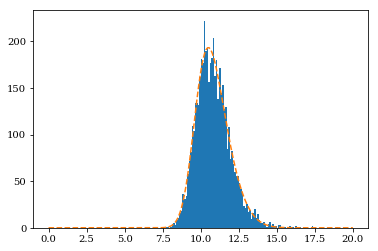

In [33]:
x = np.linspace(0,20,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_08ha_Complete/CChi_false_ages.npy")#"MC_08ha_Curtis_Dolphot3/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(15./14 * CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0] #12./14 * CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

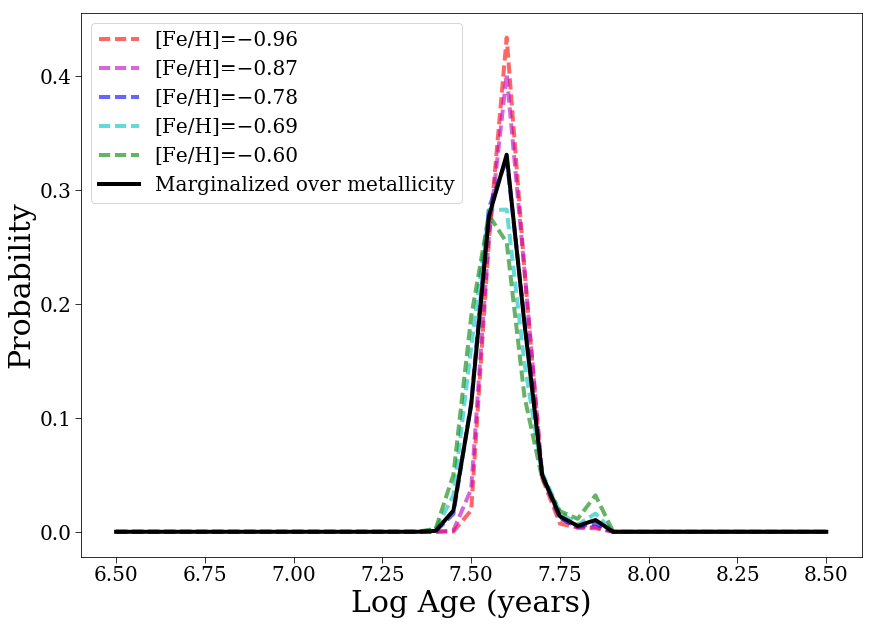

7.6


In [34]:
# Plotting all metallicities, assuming no reddening
fig, ax = plt.subplots(figsize=(14, 10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', linewidth=4, alpha=.6, label='[Fe/H]=−0.96')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', linewidth=4, alpha=.6, label='[Fe/H]=−0.87')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', linewidth=4, alpha=.6, label='[Fe/H]=−0.78')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', linewidth=4, alpha=.6, label='[Fe/H]=−0.69')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', linewidth=4, alpha=.6, label='[Fe/H]=−0.60')

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs[0,0,:] * norm(-.96) + probs[1,0,:] * norm(-.87) + probs[2,0,:] * norm(-.78) + 
            probs[3,0,:] * norm(-.69) + probs[4,0,:] * norm(-.60))/(
            norm(-.96) + norm(-.87) + norm(-.78) + norm(-.69) + norm(-.60))
plt.plot(CChi[0,0,:,3,0], probs_tot/np.sum(probs_tot), 'k', linewidth=4, label='Marginalized over metallicity')

plt.ylabel("Probability", size=30)
plt.xlabel("Log Age (years)", size=30)
ax.tick_params(axis='both', which='major', labelsize=20, length=6)
ax.tick_params(axis='both', which='minor', length=4)
plt.legend(fontsize=20)
plt.savefig('2008ha_metallicity', dpi=1000)
plt.show()


print(CChi[0,0,:,3,0][np.argmax(probs_tot)])
#np.save("New_Start(2017)/08ha_Mag_probs_clusters", probs_tot)

34.2162162162
39.5675675676
46.1081081081


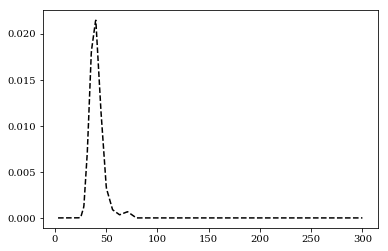

In [35]:
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, probs_tot[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

In [21]:
d200 = 38 # 200 pc onsky in pixels
d133 = (2./3) * d200
d67 = (1./3) * d200

info200 = np.zeros(info.shape) # Information for stars between 133 and 200 pc away
info133 = np.zeros(info.shape) # Information for stars between 67 and 133 pc away
info67 = np.zeros(info.shape) # Information for stars less than 67 pc away

for i in range(info.shape[0]):
    d = np.sqrt(np.sum((info[i,2:4] - SN_pos)**2))
    if d <= d67:
        info67[i] = info[i]
    elif d <= d133:
        info133[i] = info[i]
    elif d <= d200:
        info200[i] = info[i]
    else:
        print('Error: object is too far from SN')

info200 = info200[~np.all(info200 == 0, axis=1)]
info133 = info133[~np.all(info133 == 0, axis=1)]
info67 = info67[~np.all(info67 == 0, axis=1)]

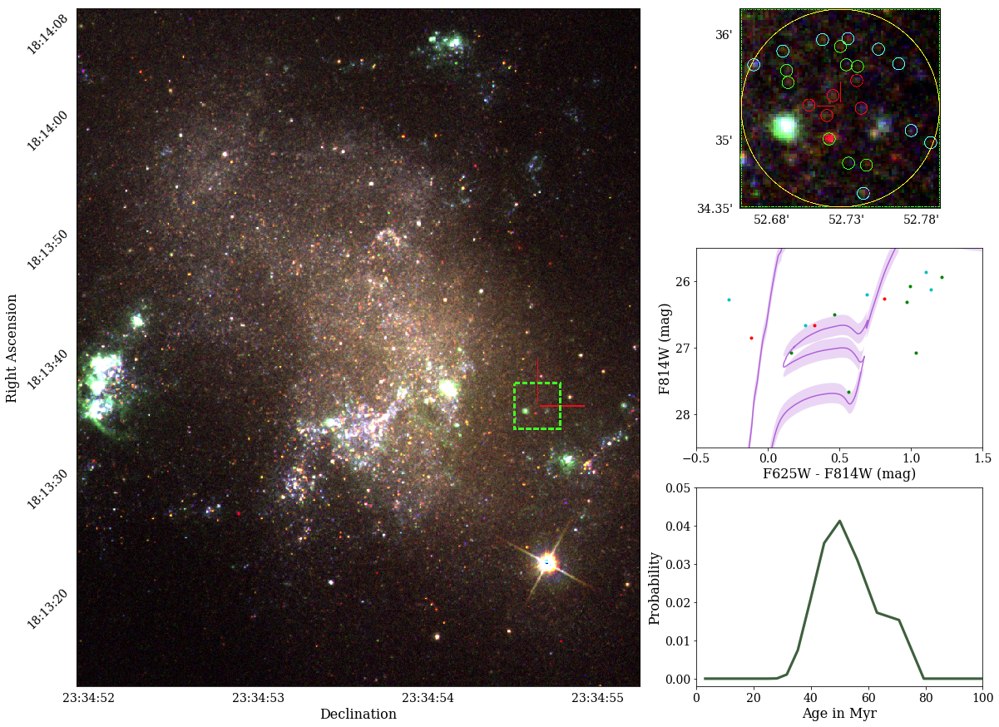

In [19]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.12, hspace=0.2)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/new_files/sn2008ha/2008ha_5kpc.6kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 828/(55.39 - 52.07) #663
x_start = x_tick*.07
ax0.set_xticks([x_start, x_start + x_tick, x_start + 2*x_tick, x_start + 3*x_tick])
ax0.set_xticklabels(['23:34:52', '23:34:53', '23:34:54', '23:34:55'], **tick_font)
y_tick = 997/(68.59 - 11.92) #795
y_start = y_tick*8.59
ax0.set_yticks([0.59*y_tick, y_start, y_start + 10*y_tick, y_start + 20*y_tick,
                y_start + 30*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['18:14:08', '18:14:00', '18:13:50', '18:13:40', '18:13:30', '18:13:20'], rotation=45, **tick_font)
# Setting labels
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/new_files/sn2008ha/2008ha_400pc.400pc_mod5.png')
ax1.imshow(image)
# Setting the ticks
x_tick = 990/(52.791 - 52.658) #767
x_start = x_tick*.022
ax1.set_xticks([x_start, x_start + .05*x_tick, x_start + .10*x_tick])
ax1.set_xticklabels(["52.68'", "52.73'", "52.78'"], **tick_font) # Append 23:34 to front for full coords
y_tick = 992/(36.24 - 34.35) #769
y_start = y_tick*.24
ax1.set_yticks([y_start, y_start + y_tick, y_start + (2-.35)*y_tick])
ax1.set_yticklabels(["36'", "35'", "34.35'"], **tick_font) # Append 18:13 for full coords
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(info200[:,41] - info200[:,54], info200[:,54], 'c.')
line2 = ax2.plot(info133[:,41] - info133[:,54], info133[:,54], 'g.')
line3 = ax2.plot(info67[:,41] - info67[:,54], info67[:,54], 'r.')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.1)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(28.5,25.5)
ax2.set_xlim(-.5, 1.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(26, 29))
ax2.set_xticks(np.arange(-.50,2,.5))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.1)
ax3.yaxis.set_label_coords(-.12, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .06, .01));

#plt.savefig('2008ha_Fig.pdf', dpi=1000)

In [20]:
x_tick = 828/((55.39 - 52.07) * np.cos(18.2417 * 2*np.pi/360))
print(x_tick) # Number of pixels in 1 arcsec
print(1/(21.23e3) * 206265) # arcsec/kpc
print(1/(21.23e3) * 206265 * x_tick) # pixels/kpc

262.594408413
9.715732454074423
2551.29701608


[ 7.7]


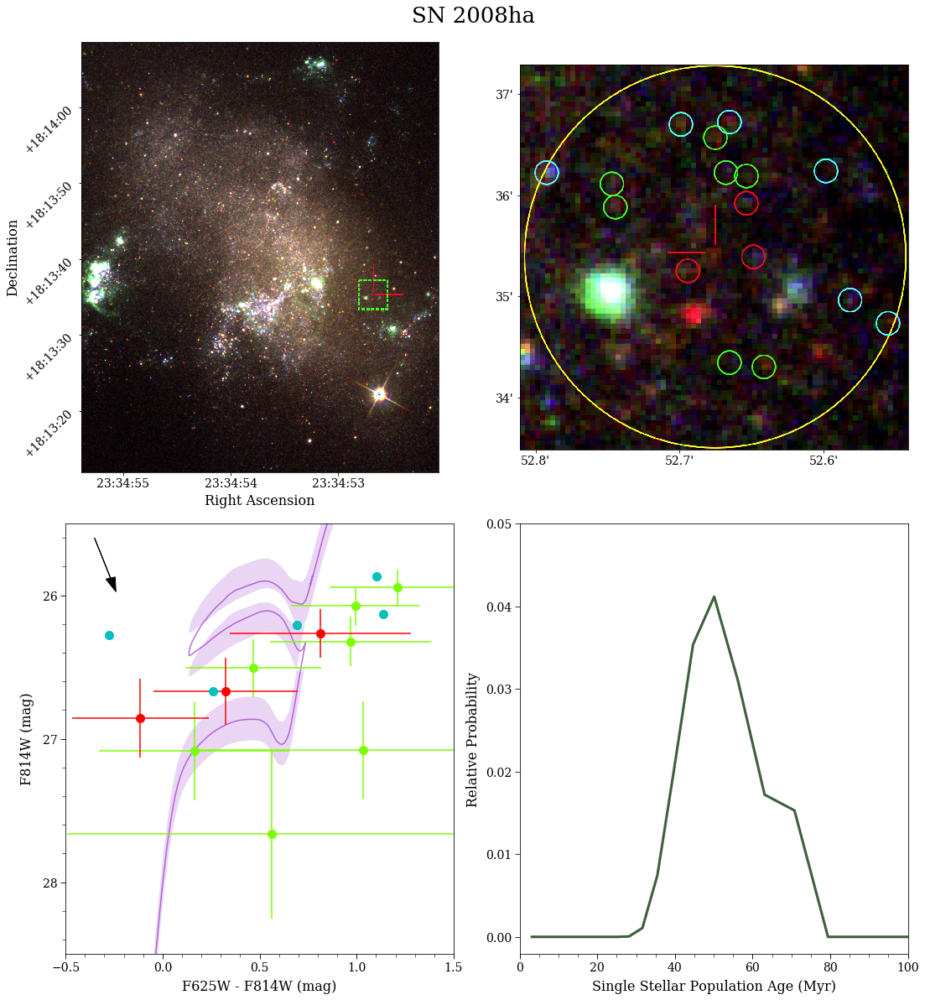

In [22]:
from matplotlib import gridspec
import matplotlib.image as im
from matplotlib.ticker import MultipleLocator
#from matplotlib_scalebar.scalebar import ScaleBar
#from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from matplotlib.patches import Rectangle

# Setup figure and grid
fig = plt.figure(figsize=(18,20))
gs = gridspec.GridSpec(2, 2)
gs.update(wspace=0.17, hspace=0.12)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

### Figure 0: Whole galaxy ###
ax0 = plt.subplot(gs[0,0])
image=im.imread(Iax_dir + '/new_files/sn2008ha/2008ha_5kpc.6kpc.png')
ax0.imshow(image)
# Setting the ticks
x_tick = 828/(55.39 - 52.07) #663
x_start = x_tick*.39
ax0.set_xticks([x_start, x_start + x_tick, x_start + 2*x_tick])
ax0.set_xticklabels(['23:34:55', '23:34:54', '23:34:53'], **tick_font)
y_tick = 997/(68.59 - 11.92) #795
y_start = y_tick*8.59
ax0.set_yticks([y_start, y_start + 10*y_tick, y_start + 20*y_tick,
                y_start + 30*y_tick, y_start + 40*y_tick])
ax0.set_yticklabels(['+18:14:00', '+18:13:50', '+18:13:40', '+18:13:30', '+18:13:20'], rotation=45, **tick_font)
# Add scalebar
#scalebar = ScaleBar((21.23e6/x_tick))
#plt.gca().add_artist(scalebar)
#scalebar = AnchoredSizeBar(ax0.transData, x_tick/21.23e3, '1 kpc', loc=2)
#ax0.add_artist(scalebar)
#ax0.plot([500,800], [10,10], 'white', lw=10)
#ax0.plot([520, 520 + x_tick], [12,12], 'black', lw=2)
#scalebar = Rectangle((10, 500), 2, 10, edgecolor='white', facecolor='none'
#ax0.add_patch(scalebar)
# Setting labels
ax0.set_xlabel("Right Ascension", **axis_font)
ax0.set_ylabel("Declination", **axis_font)
ax0.xaxis.set_label_coords(.5, -.05)
#ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.17, .5)
#ax0.yaxis.set_ticks_position('none')

### Figure 1: Zoom in on ROI ###
ax1 = plt.subplot(gs[0,1])
image=im.imread(Iax_dir + '/new_files/sn2008ha/2008ha_400pc.400pc_mod4.png')
ax1.imshow(image)
# Setting the ticks
x_tick = 998/(52.811 - 52.542) #767
x_start = x_tick*.011
ax1.set_xticks([x_start, x_start + .1*x_tick, x_start + .2*x_tick])
ax1.set_xticklabels(["52.8'", "52.7'", "52.6'"], **tick_font) # Append 23:34 to front for full coords
y_tick = 992/(37.29 - 33.49) #769
y_start = y_tick*.29
ax1.set_yticks([y_start, y_start + y_tick, y_start + 2*y_tick, y_start + 3*y_tick])
ax1.set_yticklabels(["37'", "36'", "35'", "34'"], **tick_font) # Append 18:13 for full coords
# Setting labels
ax1.xaxis.set_label_coords(.5, -.18)
#ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
#ax1.yaxis.set_ticks_position('none')

### Figure 2: Color-magnitude diagram ###
ax2 = plt.subplot(gs[1,0])
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
age_cmd = {}
ages = ages[(ages > 7.69) & (ages < 7.71)]
print(ages)
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(info200[:,41] - info200[:,54], info200[:,54], 'co', markersize=10)
#line2 = ax2.plot(info133[:,41] - info133[:,54], info133[:,54], 'go')
line2 = ax2.errorbar(info133[:,41] - info133[:,54], info133[:,54], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,43]**2 + info133[:,56]**2), yerr=info133[:,56], markersize=10)
#line3 = ax2.plot(info67[:,41] - info67[:,54], info67[:,54], 'r.')
line3 = ax2.errorbar(info67[:,41] - info67[:,54], info67[:,54], fmt='ro',
                     xerr=np.sqrt(info67[:,43]**2 + info67[:,56]**2), yerr=info67[:,56], markersize=10)
# Plots reddening vector
plt.arrow(-.35, 25.6, (3.610 - 2.792)*.1, 2.792*.1, head_width=0.05, head_length=0.1, fc='k', ec='k')
# Setting labels and axis range
ax2.set_xlabel("F625W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.06)
ax2.yaxis.set_label_coords(-.08, .5)
ax2.set_ylim(28.5,25.5)
ax2.set_xlim(-.5, 1.5)
ax2.tick_params(axis='both', which='major', labelsize=14, length=6)
ax2.tick_params(axis='both', which='minor', length=4)
#ax2.set_yticks(np.arange(26, 29))
#ax2.set_xticks(np.arange(-.50,2,.5))
ax2.xaxis.set_major_locator(MultipleLocator(.5))
ax2.xaxis.set_minor_locator(MultipleLocator(.1))
ax2.yaxis.set_major_locator(MultipleLocator(1))
ax2.yaxis.set_minor_locator(MultipleLocator(.2))

### Figure 3: Probability distribution function ###
ax3 = plt.subplot(gs[1,1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
ax3.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
ax3.set_xlabel("Single Stellar Population Age (Myr)", **axis_font)
ax3.set_ylabel("Relative Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.06)
ax3.yaxis.set_label_coords(-.1, .5)
ax3.set_xlim(0,100)
ax3.tick_params(axis='both', which='major', labelsize=14, length=6)
ax3.tick_params(axis='both', which='minor', length=4)
ax3.xaxis.set_major_locator(MultipleLocator(20))
ax3.xaxis.set_minor_locator(MultipleLocator(5))
ax3.set_yticks(np.arange(0, .06, .01));

plt.suptitle('SN 2008ha', y=.91, size=26)

plt.savefig('2008ha_Fig.pdf', dpi=1000)

## False Star Testing

In [22]:
x_pos = 1652 + 76*np.random.rand(50)
y_pos = 3142 + 76*np.random.rand(50)

f435w_mags = 17 + 12*np.random.rand(1000) # Range of 17 to 29 in mag
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST"
file = open(Iax_dir + "/new_files/sn2008ha/fake_stars.list", "w+")
for j in range(x_pos.size):
    for i in range(f435w_mags.size):
        file.write('0 1 {x} {y} {f4} {f4} {f4} {f4}\n'.format(x=x_pos[j], y=y_pos[j], f4=f435w_mags[i]))
file.close()

In [43]:
# Loading in the false star test
catalog_false_f435w = np.loadtxt(Iax_dir + "/new_files/sn2008ha/sn2008ha_f435w.fake")
catalog_false_f555w = np.loadtxt(Iax_dir + "/new_files/sn2008ha/sn2008ha_f555w.fake")
catalog_false_f625w = np.loadtxt(Iax_dir + "/new_files/sn2008ha/sn2008ha_f625w.fake")
catalog_false_f814w = np.loadtxt(Iax_dir + "/new_files/sn2008ha/sn2008ha_f814w.fake")

In [44]:
recovered_mags = np.zeros([50000,23]) # 1. X position, 2. Y position, 3. Inserted Mag, 4. Recovered mag (f435w),
# 5. S/N (f435w), 6. Sharpness (f435w), 7. Roundness (f435w), 8. Crowding (f435w), 9.+ same, for other filters
for i in range(catalog_false_f435w.shape[0]):
    # X, Y, and Inserted Magnitude
    recovered_mags[i,0] = catalog_false_f435w[i,2]
    recovered_mags[i,1] = catalog_false_f435w[i,3]
    recovered_mags[i,2] = catalog_false_f435w[i,5]
    # Recovered mag in F435W
    if (catalog_false_f435w[i,14] == 0) and (catalog_false_f435w[i,15] == 0):
        recovered_mags[i,3] = 99.999
    else:
        recovered_mags[i,3] = catalog_false_f435w[i,27]
        recovered_mags[i,4:8] = catalog_false_f435w[i,17:21]
    # Recovered mag in F555W
    if (catalog_false_f555w[i,14] == 0) and (catalog_false_f555w[i,15] == 0):
        recovered_mags[i,8] = 99.999
    else:
        recovered_mags[i,8] = catalog_false_f555w[i,27]
        recovered_mags[i,9:13] = catalog_false_f555w[i,17:21]
    # Recovered mag in F625W
    if (catalog_false_f625w[i,14] == 0) and (catalog_false_f625w[i,15] == 0):
        recovered_mags[i,13] = 99.999
    else:
        recovered_mags[i,13] = catalog_false_f625w[i,27]
        recovered_mags[i,14:18] = catalog_false_f625w[i,17:21]
    # Recovered mag in F814W
    if (catalog_false_f814w[i,14] == 0) and (catalog_false_f814w[i,15] == 0):
        recovered_mags[i,18] = 99.999
    else:
        recovered_mags[i,18] = catalog_false_f814w[i,27]
        recovered_mags[i,19:23] = catalog_false_f814w[i,17:21]

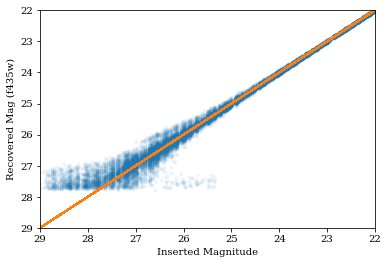

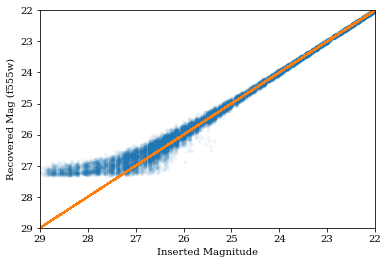

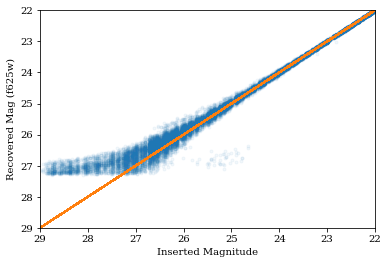

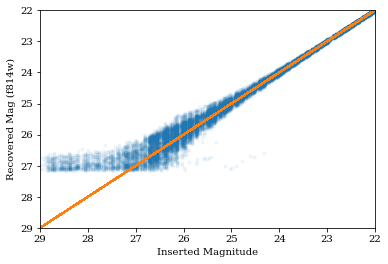

In [45]:
plt.plot(recovered_mags[:,2], recovered_mags[:,3], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f435w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,8], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f555w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,13], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f625w)")
plt.show()

plt.plot(recovered_mags[:,2], recovered_mags[:,18], '.', alpha=.05)
plt.plot(recovered_mags[:,2], recovered_mags[:,2], '--')
plt.ylim(29,22)
plt.xlim(29,22)
plt.xlabel("Inserted Magnitude")
plt.ylabel("Recovered Mag (f814w)")
plt.show()

In [46]:
f435w_mags = []
f435w_recover = []
f555w_mags = []
f555w_recover = []
f625w_mags = []
f625w_recover = []
f814w_mags = []
f814w_recover = []
# Calculate recovery percentage as a function of inserted mag
for i in range(catalog_false_f435w.shape[0]):
    f435w_mags.append(recovered_mags[i,2])
    f555w_mags.append(recovered_mags[i,2])
    f625w_mags.append(recovered_mags[i,2])
    f814w_mags.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,3]) < .5:
        f435w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,8]) < .5:
        f555w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,13]) < .5:
        f625w_recover.append(recovered_mags[i,2])
    if abs(recovered_mags[i,2] - recovered_mags[i,18]) < .5:
        f814w_recover.append(recovered_mags[i,2])

In [47]:
# Setting up the histogram bins w/ .1 mag resolution
b = []
for i in range(121):
    b.append(17 + i/10.)

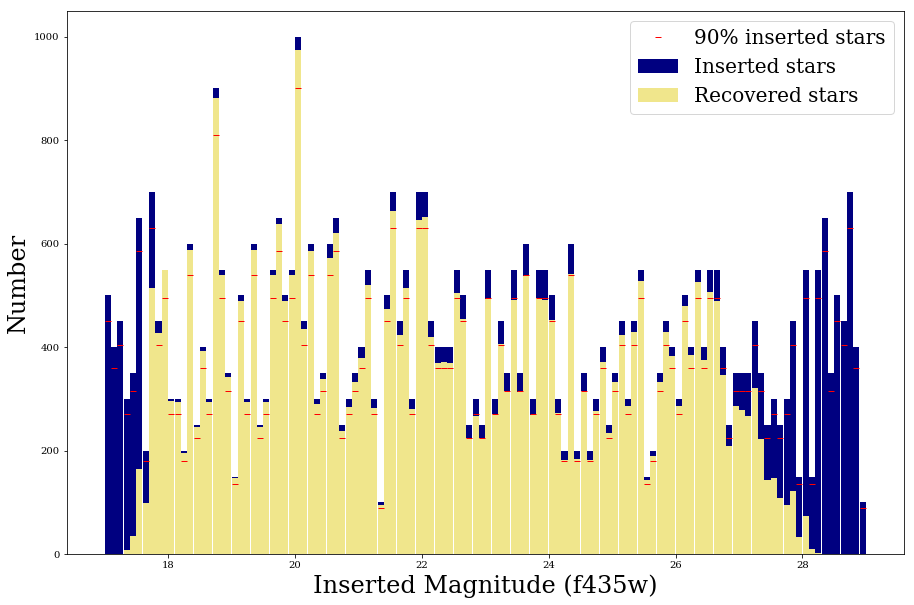

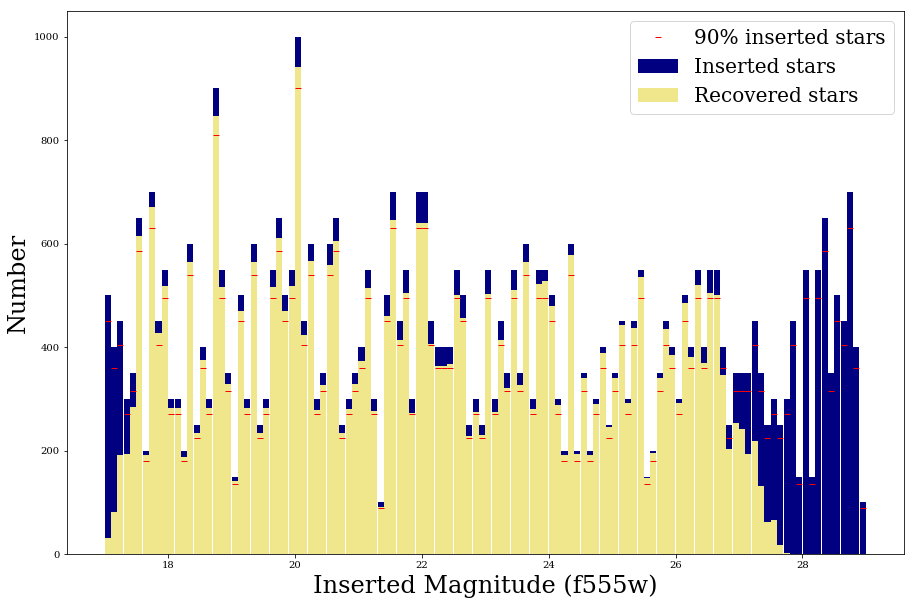

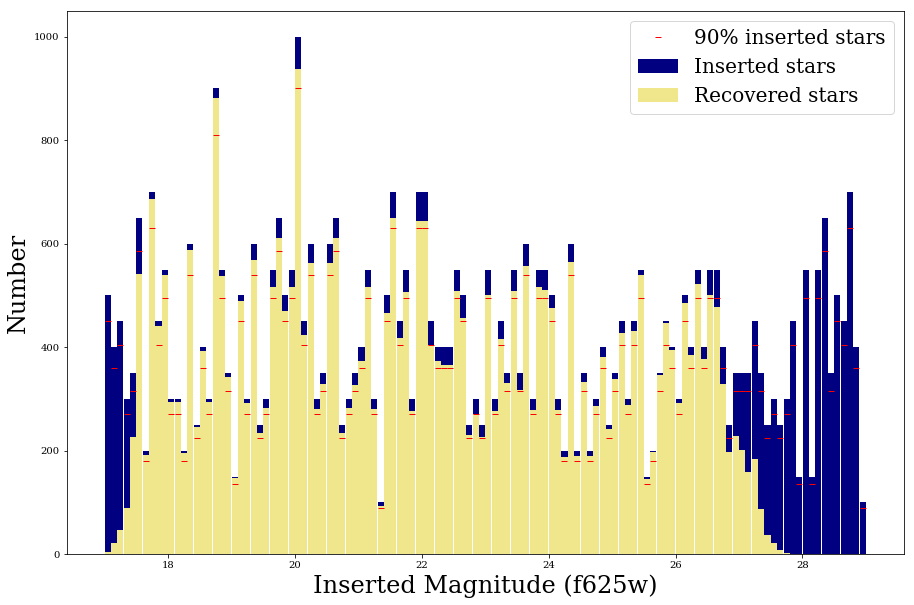

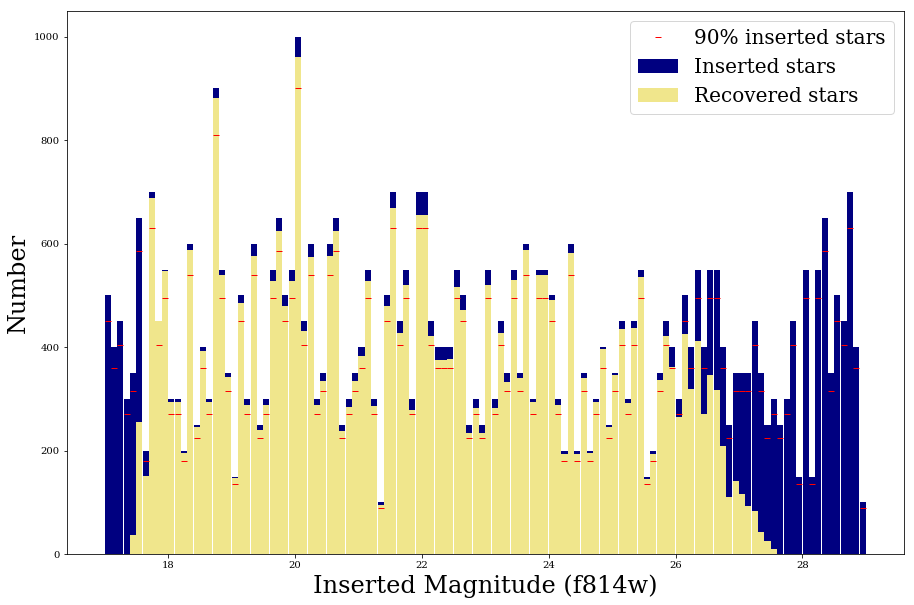

In [48]:
plt.subplots(figsize=(15, 10))
#b = [17,17.5,18,18.5,19,19.5,20,20.5,21,21.5,22,22.5,23,23.5,24,24.5,25,25.5,26,26.5,27,27.5,28,28.5,29,29.5,30]
h4 = plt.hist(f435w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r4 = plt.hist(f435w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h4[1][:-1]+.05, .9*h4[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f435w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h5 = plt.hist(f555w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r5 = plt.hist(f555w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h5[1][:-1]+.05, .9*h5[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f555w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h6 = plt.hist(f625w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r6 = plt.hist(f625w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h6[1][:-1]+.05, .9*h6[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f625w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

plt.subplots(figsize=(15, 10))
h8 = plt.hist(f814w_mags, bins=b, facecolor='navy', rwidth=.95, label='Inserted stars')
r8 = plt.hist(f814w_recover, bins=b, rwidth=.95, facecolor='khaki', label='Recovered stars')
plt.plot(h8[1][:-1]+.05, .9*h8[0], 'r_', markersize=6, label='90% inserted stars')
plt.xlabel("Inserted Magnitude (f814w)", fontsize=24)
plt.ylabel("Number", fontsize=24)
plt.legend(fontsize=20)
plt.show()

frac_f435w = r4[0]/h4[0]
frac_f555w = r5[0]/h5[0]
frac_f625w = r6[0]/h6[0]
frac_f814w = r8[0]/h8[0]

22.75
22.15
22.15
25.95


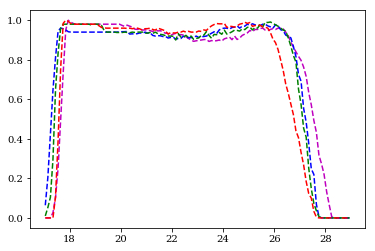

In [49]:
from scipy.interpolate import interp1d

plt.plot(h4[1][:-1]+.05, frac_f435w, 'm--')
plt.plot(h5[1][:-1]+.05, frac_f555w, 'b--')
plt.plot(h6[1][:-1]+.05, frac_f625w, 'g--')
plt.plot(h8[1][:-1]+.05, frac_f814w, 'r--')

print(h4[1][:-1][np.argmin(abs(frac_f435w - .9))] + .05)
print(h5[1][:-1][np.argmin(abs(frac_f555w - .9))] + .05)
print(h6[1][:-1][np.argmin(abs(frac_f625w - .9))] + .05)
print(h8[1][:-1][np.argmin(abs(frac_f814w - .9))] + .05)

In [53]:
# Save recovery fractions and associated magnitudes in two numpy arrays
frac_array = np.array([frac_f435w, frac_f555w, frac_f625w, frac_f814w])
bin_array = np.array([h4[1], h5[1], h6[1], h8[1]])
np.save('08ha_frac.npy', frac_array)
np.save('08ha_bins.npy', bin_array)

## Testing ability to recover age PDF from known injected age

In [50]:
import time

Exposure_times = 1.65 * np.array([1164, 764, 840, 1240])
Zeropoints = np.array([25.0164, 24.9694, 24.9904, 24.7724]) + np.log10(2)

def Random_mass_mag(mass, mags, mags_exact):
    m = invSalpeter(np.random.random(), 4, np.amax(mass))
 
    mag4, mag5, mag6, mag8 = mags
    mag4_ex, mag5_ex, mag6_ex, mag8_ex = mags_exact
    # Determines the magnitude corresponding to the point on the isochrone closest in mass to the chosen mass
    m_index = np.argmin(np.abs(m - mass))
    mags = np.array([mag4[m_index], mag5[m_index], mag6[m_index], mag8[m_index]])
    mags_exact = np.array([mag4_ex[m_index], mag5_ex[m_index], mag6_ex[m_index], mag8_ex[m_index]])
    #print(mags, mags_exact, mags - mags_exact, dist_adjust - dist_adj_exact)
    loc = Exposure_times * 10**((Zeropoints - mags)/2.5)
    scale = np.array([73 + np.sqrt(loc[0]), 71 + np.sqrt(loc[1]), 86 + np.sqrt(loc[2]), 130 + np.sqrt(loc[3])])
        
    fluxs = np.random.normal(loc=loc, scale=scale, size=len(mags))
    # Computes signal to noise ratio, to be used in selecting observable stars. SN is overall S/N ratio
    N = np.sqrt(1/np.sum(np.power(scale, -2)))
    SN = N * np.sum(fluxs/np.power(scale, 2))
    # SN2 is the maximum S/N ratio in a single band
    SN2 = np.amax(fluxs/scale)
    return [m, SN, SN2, mags_exact, mags, fluxs]

def SalpeterUnNorm(m):
    return m**-2.35
def invSalpeter(u, lower, upper):
    norm = integrate.quad(SalpeterUnNorm, lower, upper)[0]
    return (lower**(-1.35) - 1.35 * norm * u)**(-1/1.35)

In [51]:
print(Zeropoints)

[ 25.31743  25.27043  25.29143  25.07343]


In [298]:
nstars = 15
age = 7
df = isochrones[-0.78]
np.random.seed()

dist = np.random.normal(loc=21.81e6, scale=1.53e6)
dist_adjust = 5 * (np.log10(dist) - 1)
dist_adj_exact = 5 * (np.log10(21.81e6) - 1) # Distance adjustment without error
flat = (100 * 206265)/(dist * .05)
flat_int = int(np.round(flat*5))
flat_int_exact = int(np.round(5*(100 * 206265)/(21.81e6 * .05)))

while (flat_int < 0) or (flat_int >= 2000): # Checks to make sure distance isn't so crazy it'll cause errors
    dist = np.random.normal(loc=distance, scale=distance_error)
    dist_adjust = 5 * (np.log10(dist) - 1)
    a = flat_int
    flat = (100 * 206265)/(dist * .05)
    flat_int = int(np.round(5 * flat))
    print("Was ", a, "but is now ", flat_int)
    
idx = df.log10_isochrone_age_yr == age
mass = df[idx].initial_mass

mags = [] # List of mags with normal distance error
mags.append(df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*reddening)
mags.append(df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*reddening)
mags.append(df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*reddening)
mags.append(df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*reddening)

mags_exact = [] # List of mags with exact distance
mags_exact.append(df[idx].ACS_WFC_F435W + dist_adj_exact + F435W_ext + 3.610*reddening)
mags_exact.append(df[idx].ACS_WFC_F555W + dist_adj_exact + F555W_ext + 2.792*reddening)
mags_exact.append(df[idx].ACS_WFC_F625W + dist_adj_exact + F625W_ext + 2.219*reddening)
mags_exact.append(df[idx].ACS_WFC_F814W + dist_adj_exact + F814W_ext + 1.526*reddening)

# This arrray will hold 1. Mass, 2. Radial distance, 3-6. Magnitudes (no errors), 7-10. Magnitudes (just distance error)
# 11-14. Magnitudes (all errors)
False_stars = np.zeros([nstars, 2 + 3*len(mags)])

temp = 0
phys_dist_temp = 0
for x in range(nstars):
    False_stars[x,0], SN, SN2, mag_exact, mag_d_error, fluxs = Random_mass_mag(mass, mags, mags_exact)
    False_stars[x,2:6] = mag_exact # The fluxs with no errors
    False_stars[x,6:10] = mag_d_error # The fluxs with just distance errors
    False_stars[x,10:] = fluxs
    
    frac_temp = np.zeros(len(mags))
    while not any(np.random.random() < frac_temp):
        # Checks to make sure that the S/N ratio is high enough, and there is positive flux in each filter
        t = time.time()
        while (SN < 3.5) or (SN2 < 2.5) or any(False_stars[x,10:] < 0):
            False_stars[x,0], SN, SN2, mag_exact, mag_d_error, fluxs = Random_mass_mag(mass, mags, mags_exact)
            False_stars[x,2:6] = mag_exact # The fluxs with no errors
            False_stars[x,6:10] = mag_d_error # The fluxs with just distance errors
            False_stars[x,10:] = fluxs
            if time.time() - t > 10:
                print("Too much time elapsed. Quitting.")
                break
        
        # Applies the recovery fraction to generated magnitudes
        mag_temp = Zeropoints - 2.5 * np.log10(False_stars[x,10:]/Exposure_times)
        for y in range(len(mags)): # Checks each filter
            mag_index = np.argmin(np.abs(mag_temp[y] - (bin_array[y][:-1] + bin_array[y][1:])/2))
            frac_temp[y] = frac_array[y][mag_index]
    
    
    # Converts from flux to magnitude in each filter
    False_stars[x,10:] = Zeropoints - 2.5 * np.log10(False_stars[x,10:]/Exposure_times)
    
    sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(dist * 3.086e13 * .05)
    # Adds in inherent spread in star position at formation with flat top of 100 pc, plus spread over time.
    False_stars[x,1] = abs(np.random.normal(loc=0, scale=sigma)) + flat * np.random.random()

In [299]:
metallicity = np.array([-.96, -.87, -.78, -.69, -.60])
reddening = np.array([0])
CChi_test = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
dist_adjust = 5 * (np.log10(21.81e6) - 1)

for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi_test[k, j, i, 1, :] = met
            CChi_test[k, j, i, 2, :] = red
            CChi_test[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adj_exact + F435W_ext + 3.610*red
            mag_555 = df[idx].ACS_WFC_F555W + dist_adj_exact + F555W_ext + 2.792*red
            mag_625 = df[idx].ACS_WFC_F625W + dist_adj_exact + F625W_ext + 2.219*red
            mag_814 = df[idx].ACS_WFC_F814W + dist_adj_exact + F814W_ext + 1.526*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(dist * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(21.81e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(False_stars.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (False_stars[l,10] > 90) or (False_stars[l,11] > 90) or (False_stars[l,12] > 90) or (False_stars[l,13] > 90):
                    print("Something went wrong!")
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                try: phys_dist_weight = weight_func[1999 + int(False_stars[l,1]*5)]
                except IndexError: phys_dist_weight = weight_func[weight_func.size - 1]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((False_stars[l,10] - mag_435)**2 + (False_stars[l,11] - mag_555)**2
                                                + (False_stars[l,12] - mag_625)**2 + (False_stars[l,13] - mag_814)**2)))**2
    
            phys_dist_temp /= (False_stars.shape[0])
            CChi_test[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

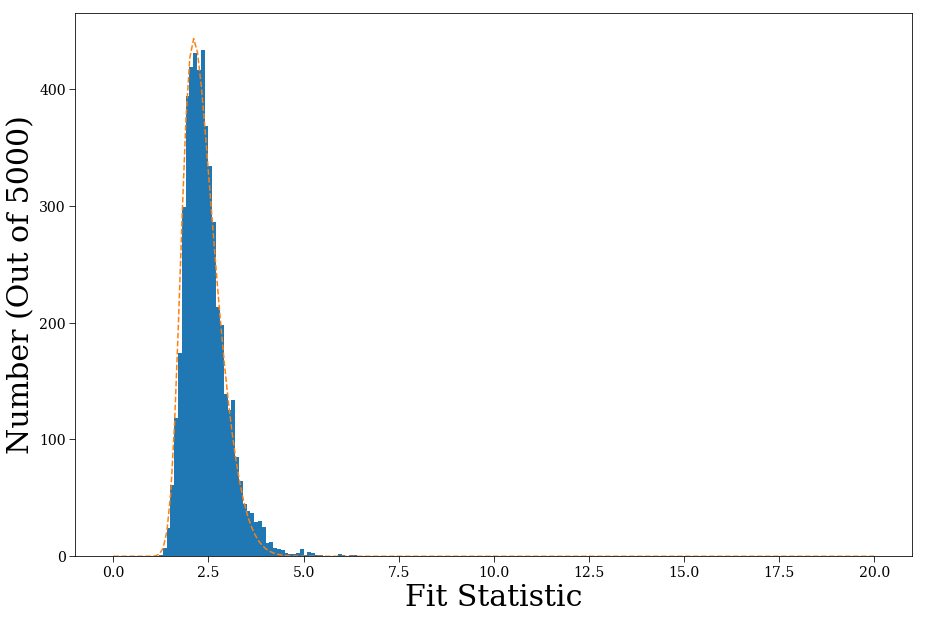

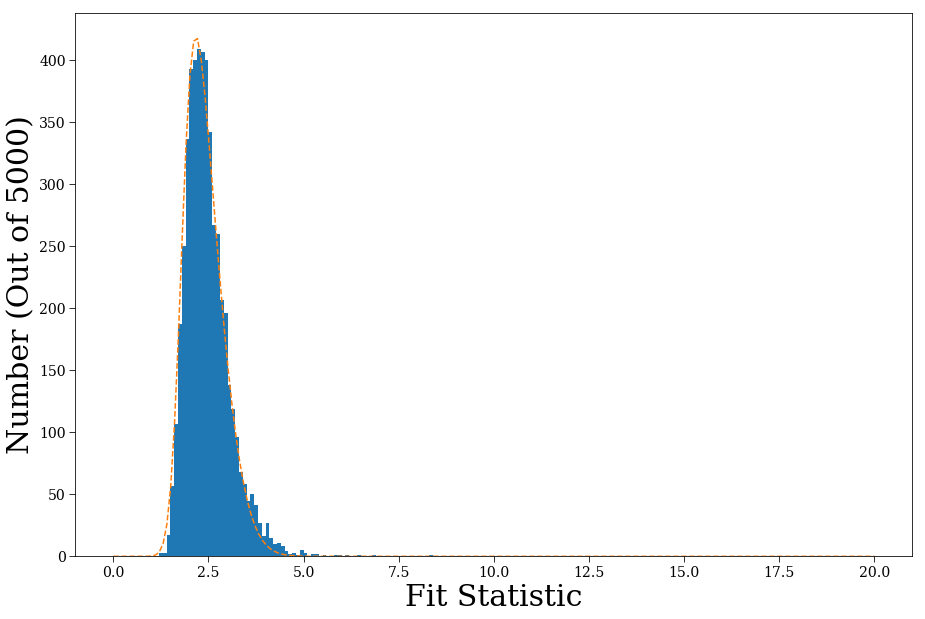

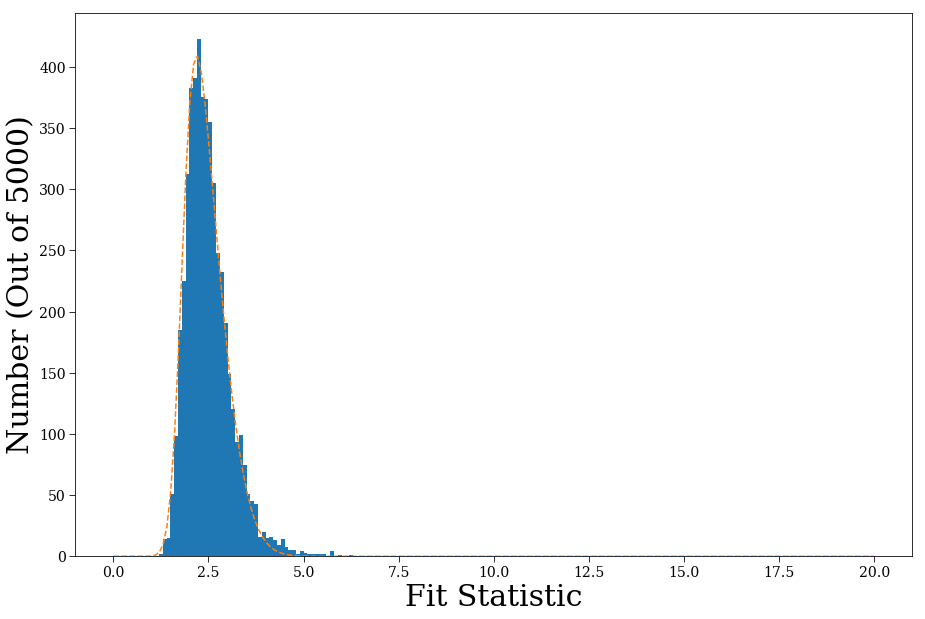

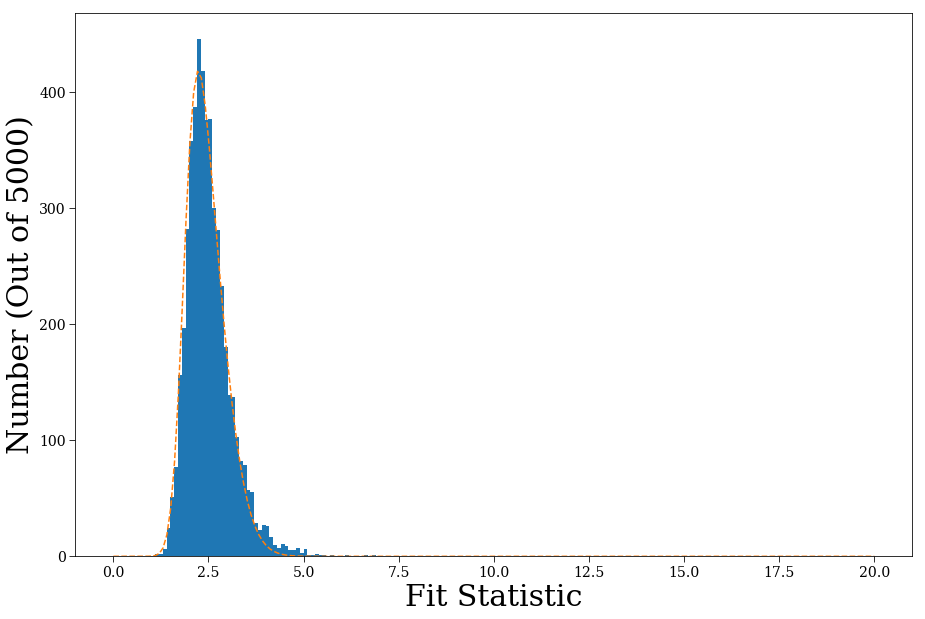

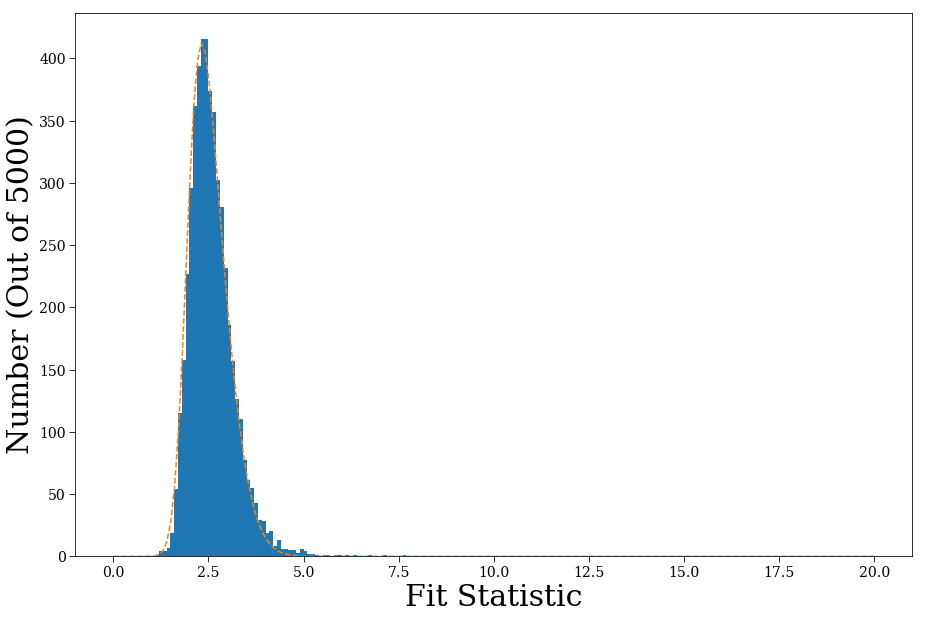

...

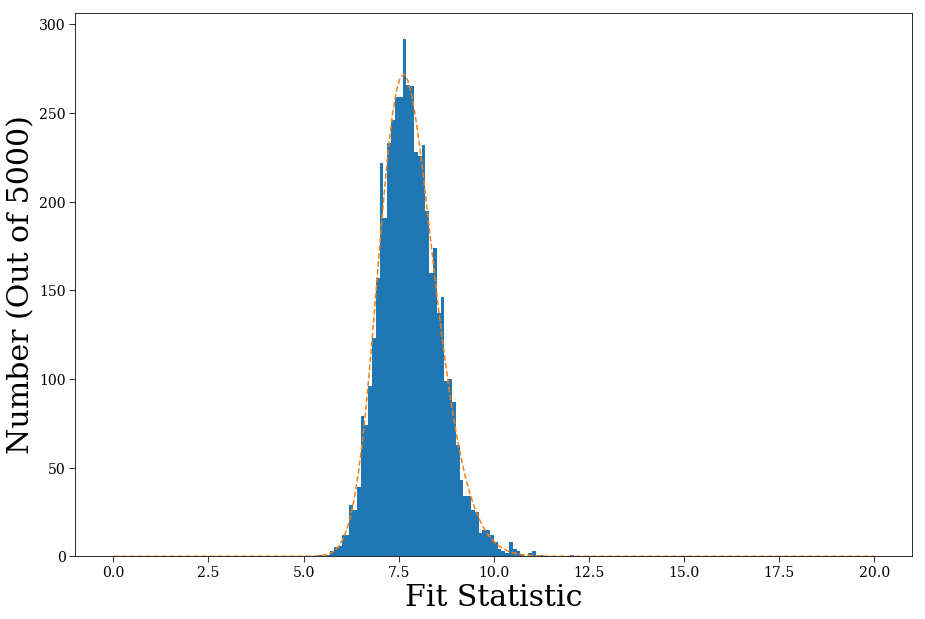

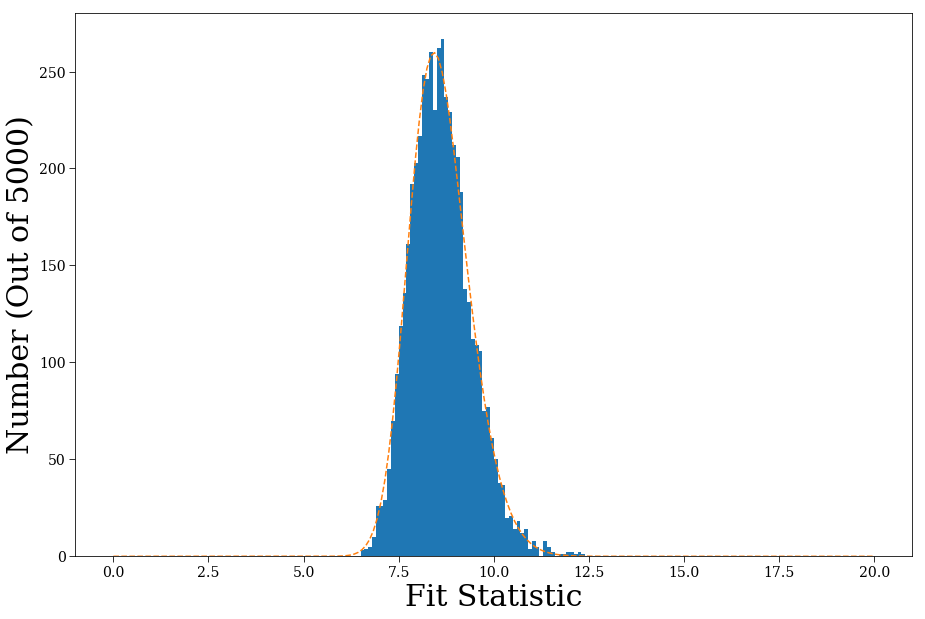

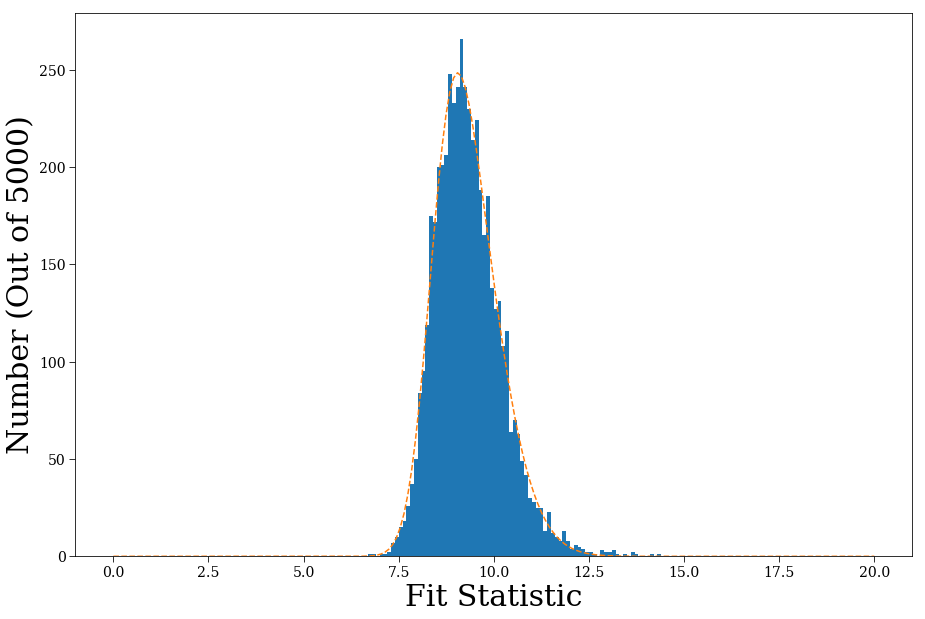

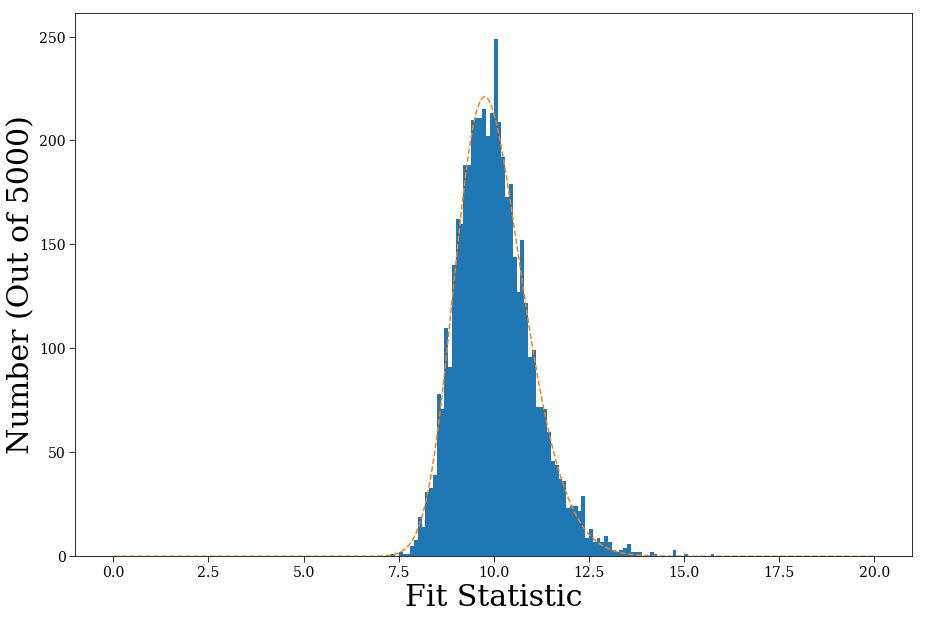

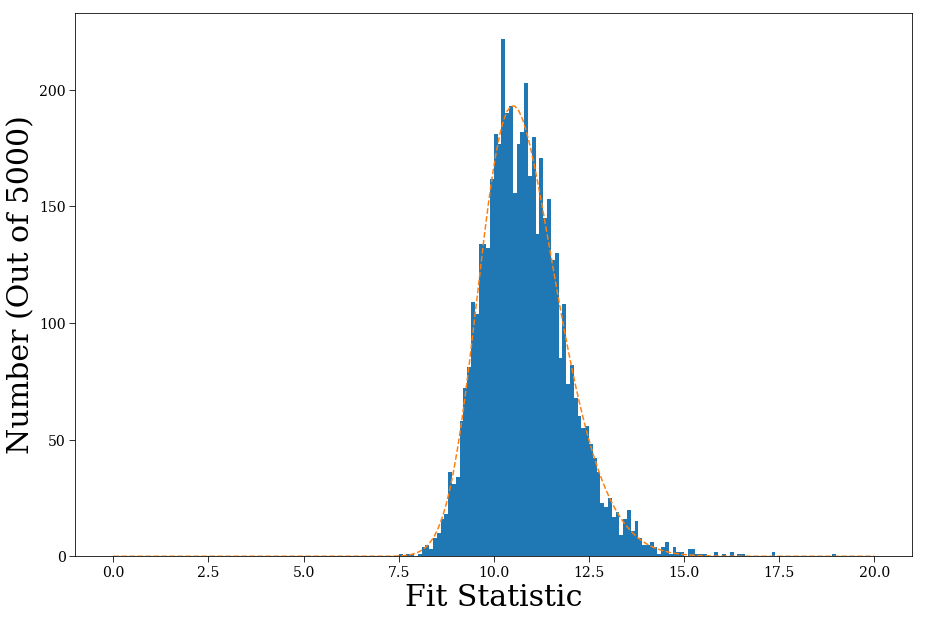

In [300]:
x = np.linspace(0,20,200)
probs_test = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_08ha_Complete/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs_test[k,j,i] = 0
                    break
            if halt == True:
                probs_test[k,j,i] = 0
                continue
            fig, ax = plt.subplots(figsize=(15, 10))
            y = plt.hist(15./14 * CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.xlabel("Fit Statistic", size=30)
            plt.ylabel("Number (Out of 5000)", size=30)
            ax.tick_params(axis='both', which='major', labelsize=14, length=6)
            plt.show()
            norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs_test[k,j,i] = skew(CChi_test[k,j,i,0,0], *popt)/norm

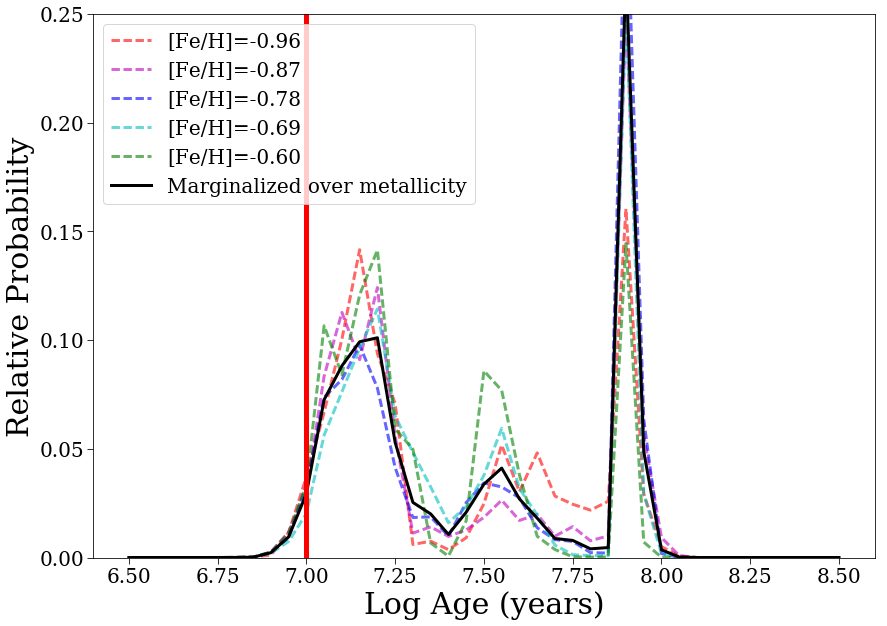

In [301]:
# Plotting all metallicities, assuming no reddening
fig, ax = plt.subplots(figsize=(14, 10));
plt.plot(CChi_test[0, 0, :, 3, 0], probs_test[0,0,:]/np.sum(probs_test[0,0,:]), 'r--', alpha=.6, linewidth=3, label='[Fe/H]=-0.96')
plt.plot(CChi_test[1, 0, :, 3, 0], probs_test[1,0,:]/np.sum(probs_test[1,0,:]), 'm--', alpha=.6, linewidth=3, label='[Fe/H]=-0.87')
plt.plot(CChi_test[2, 0, :, 3, 0], probs_test[2,0,:]/np.sum(probs_test[2,0,:]), 'b--', alpha=.6, linewidth=3, label='[Fe/H]=-0.78')
plt.plot(CChi_test[3, 0, :, 3, 0], probs_test[3,0,:]/np.sum(probs_test[3,0,:]), 'c--', alpha=.6, linewidth=3, label='[Fe/H]=-0.69')
plt.plot(CChi_test[4, 0, :, 3, 0], probs_test[4,0,:]/np.sum(probs_test[4,0,:]), 'g--', alpha=.6, linewidth=3, label='[Fe/H]=-0.60')

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_test_tot = (probs_test[0,0,:] * norm(-.96) + probs_test[1,0,:] * norm(-.87) + probs_test[2,0,:] * norm(-.78) + 
            probs_test[3,0,:] * norm(-.69) + probs_test[4,0,:] * norm(-.60))/(
            norm(-.96) + norm(-.87) + norm(-.78) + norm(-.69) + norm(-.60))
plt.plot(CChi_test[0,0,:,3,0], probs_test_tot/np.sum(probs_test_tot), 'k', linewidth=3, label='Marginalized over metallicity')
plt.axvline(x=7, color='r', linewidth=5)

plt.ylabel("Relative Probability", size=30)
plt.xlabel("Log Age (years)", size=30)
ax.tick_params(axis='both', which='major', labelsize=20, length=6)
ax.tick_params(axis='both', which='minor', length=4)
plt.ylim(0,.25)
plt.legend(fontsize=20)
#plt.savefig('Injected_Age2.pdf', dpi=1000)
plt.show()

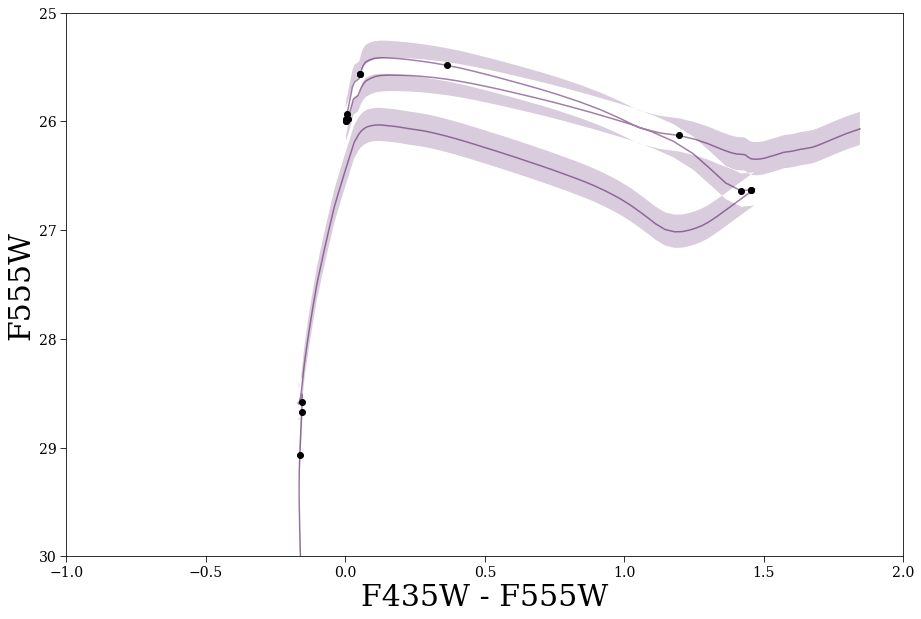

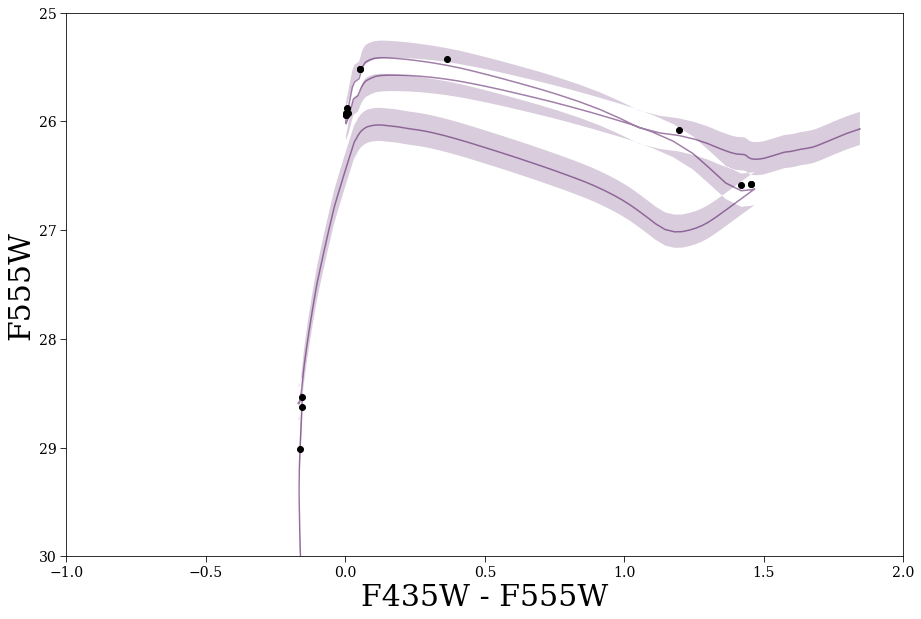

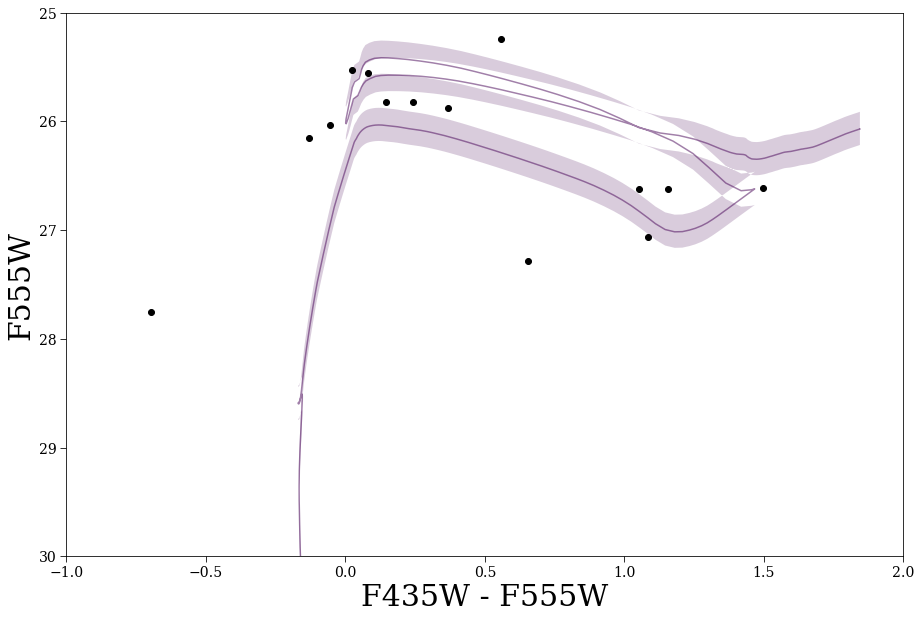

In [157]:
# fix metallicity, vary age
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
age_cmd = {}
ages = ages[(ages > 7.39) & (ages < 7.41)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(21.81e6) - 1)
    F435W_ext = 0.283 # extinction in F435W in UGC 12682 from NED
    F555W_ext = 0.219 # extinction in F555W in UGC 12682 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)

fig, ax = plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
plt.plot(False_stars[:,2] - False_stars[:,3], False_stars[:,3], 'ko')
plt.xlabel("F435W - F555W", size=30)
plt.ylabel("F555W", size=30)
ax.tick_params(axis='both', which='major', labelsize=14, length=6)
ax.tick_params(axis='both', which='minor', length=4)
plt.ylim(30,25)
plt.xlim(-1, 2)
plt.draw()
plt.show()

fig, ax = plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')

line2 = plt.plot(False_stars[:,6] - False_stars[:,7], False_stars[:,7], 'ko')
plt.xlabel("F435W - F555W", size=30)
plt.ylabel("F555W", size=30)
ax.tick_params(axis='both', which='major', labelsize=14, length=6)
ax.tick_params(axis='both', which='minor', length=4)
plt.ylim(30,25)
plt.xlim(-1, 2)
plt.draw()
plt.show()

fig, ax = plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')

line3 = plt.plot(False_stars[:,10] - False_stars[:,11], False_stars[:,11], 'ko')
plt.xlabel("F435W - F555W", size=30)
plt.ylabel("F555W", size=30)
ax.tick_params(axis='both', which='major', labelsize=14, length=6)
ax.tick_params(axis='both', which='minor', length=4)
plt.ylim(30,25)
plt.xlim(-1, 2)
plt.draw()
plt.show()

In [158]:
print(5 * (np.log10(21.81e6) - 1), dist_adj_exact, dist_adjust, 21.81e6, dist)

31.6932783279 31.6932783279 31.6932783279 21810000.0 21278022.193261467


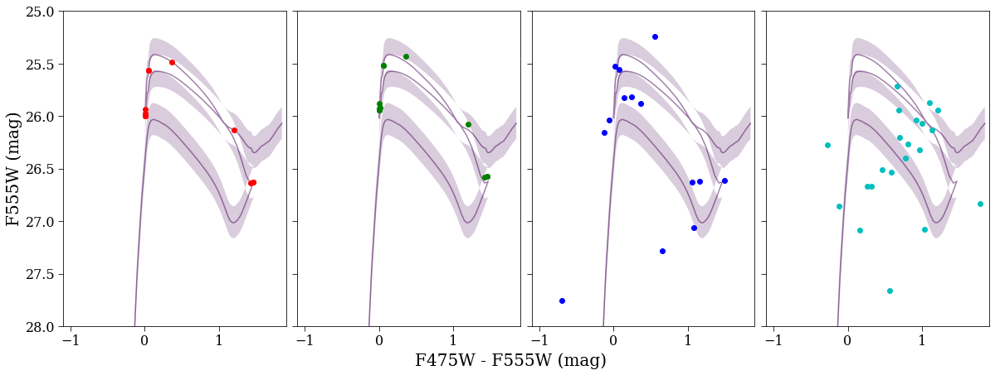

In [171]:
f, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=4, sharex=True, sharey=True, figsize=(20,7))

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax0.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    ax0.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    ax1.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    ax1.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    ax2.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    ax3.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    ax3.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
ax0.plot(False_stars[:,2] - False_stars[:,3], False_stars[:,3], 'ro')
ax1.plot(False_stars[:,6] - False_stars[:,7], False_stars[:,7], 'go')
ax2.plot(False_stars[:,10] - False_stars[:,11], False_stars[:,11], 'bo')
ax3.plot(info[:,41] - info[:,54], info[:,54], 'co')

#plt.xlabel("F435W - F555W")
#plt.ylabel("F555W")
ax0.set_ylim(28,25)
ax0.set_xlim(-1.1, 1.9)
ax1.set_ylim(28,25)
ax1.set_xlim(-1.1, 1.9)
ax2.set_ylim(28,25)
ax2.set_xlim(-1.1, 1.9)
ax3.set_ylim(28,25)
ax3.set_xlim(-1.1, 1.9)

plt.setp([a.get_yticklabels() for a in f.axes[1:]], visible=False);

for a in (ax0, ax1, ax2, ax3):
    a.tick_params(axis='both', which='major', labelsize=16, length=6)
    a.tick_params(axis='both', which='minor', length=4)
    
f.subplots_adjust(wspace=.05)
ax0.set_ylabel("F555W (mag)", fontsize=20)
f.text(.5,.03, "F475W - F555W (mag)", ha="center", fontsize=20)
plt.savefig('StepByStep.pdf', dpi=1000)
plt.show()

## FLASH Plots

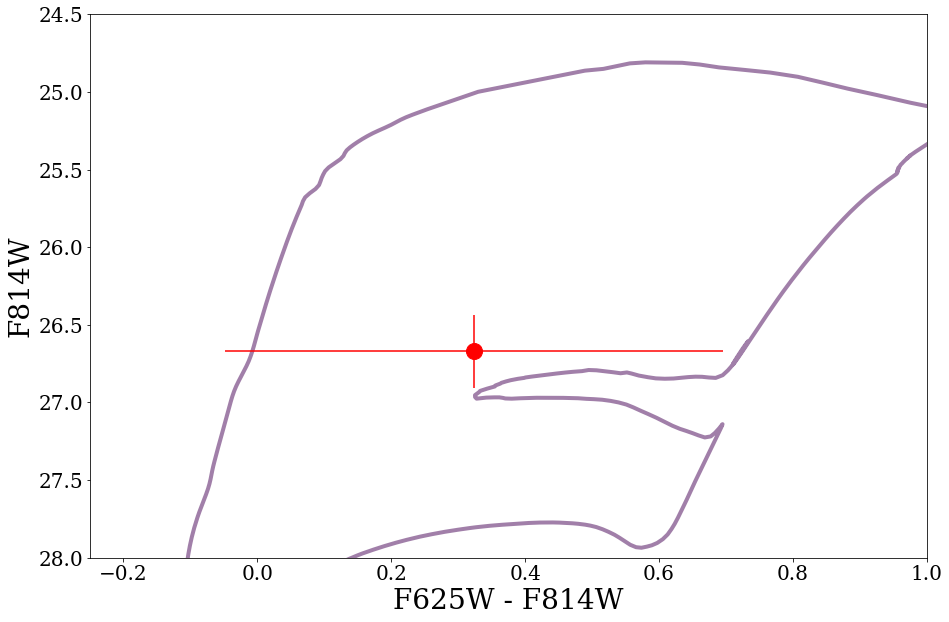

In [340]:
ages = ages[(ages > 7.89) & (ages < 7.91)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0, linewidth=4)
    break
    #plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
plt.errorbar(info67[1,41] - info67[1,54], info67[1,54], fmt='ro',
                     xerr=np.sqrt(info67[1,43]**2 + info67[1,56]**2), yerr=info67[1,56], markersize=16)

plt.xlabel("F625W - F814W", size=28)
plt.ylabel("F814W", size=28)
plt.ylim(28,24.5)
plt.xlim(-.25, 1)
plt.tick_params(axis='both', which='major', labelsize=20)

[ 7.7]
7.7


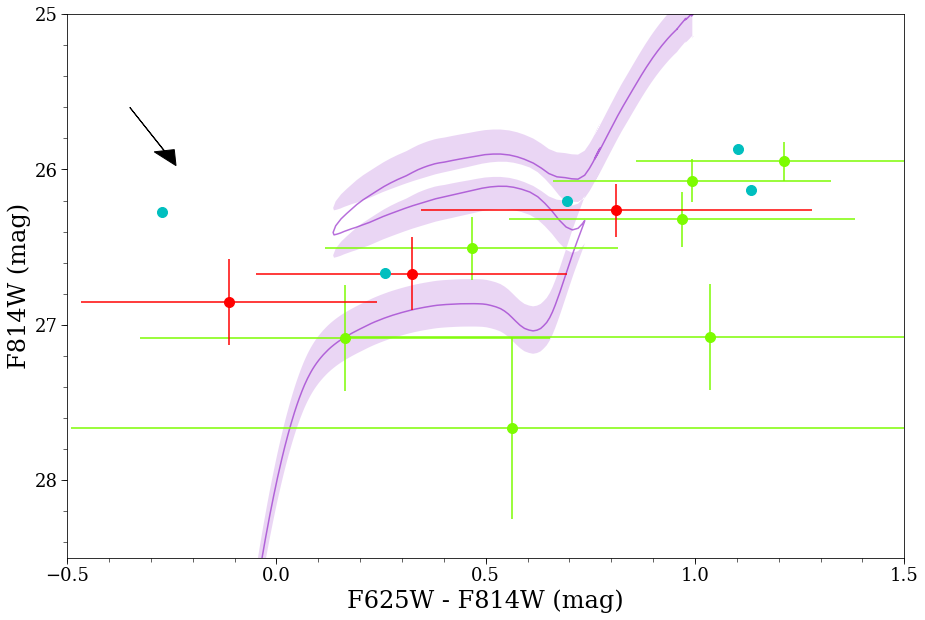

In [432]:
fig, ax = plt.subplots(figsize=(15, 10))

ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()
age_cmd = {}
ages = ages[(ages > 7.69) & (ages < 7.71)]
print(ages)
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.7, color='darkorchid', zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor='darkorchid', alpha=0.2, edgecolor='none')
    print(age)
    break
# Plots stars
line1 = plt.plot(info200[:,41] - info200[:,54], info200[:,54], 'co', markersize=10)
line2 = plt.errorbar(info133[:,41] - info133[:,54], info133[:,54], color='lawngreen', marker='o', linestyle='',
                    xerr=np.sqrt(info133[:,43]**2 + info133[:,56]**2), yerr=info133[:,56], markersize=10)
line3 = plt.errorbar(info67[:,41] - info67[:,54], info67[:,54], fmt='ro',
                     xerr=np.sqrt(info67[:,43]**2 + info67[:,56]**2), yerr=info67[:,56], markersize=10)

plt.arrow(-.35, 25.6, (3.610 - 2.792)*.1, 2.792*.1, head_width=0.05, head_length=0.1, fc='k', ec='k')
# Setting labels and axis range
plt.xlabel("F625W - F814W (mag)", size=24)
plt.ylabel("F814W (mag)", size=24)
#plt.xaxis.set_label_coords(.5, -.06)
#plt.yaxis.set_label_coords(-.08, .5)
plt.ylim(28.5,25)
plt.xlim(-.5, 1.5)
plt.tick_params(axis='both', which='major', labelsize=18, length=6)
plt.tick_params(axis='both', which='minor', length=4)
#ax2.set_yticks(np.arange(26, 29))
#ax2.set_xticks(np.arange(-.50,2,.5))
ax.xaxis.set_major_locator(MultipleLocator(.5))
ax.xaxis.set_minor_locator(MultipleLocator(.1))
ax.yaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_minor_locator(MultipleLocator(.2))

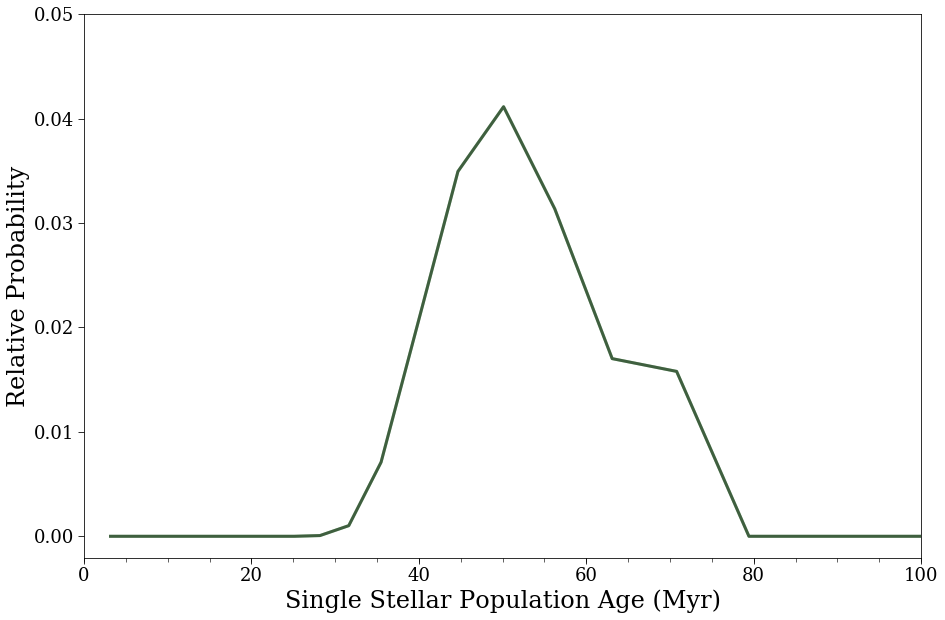

In [350]:
fig, ax = plt.subplots(figsize=(15, 10))
norm_linear = np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6)
plt.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'g-', alpha=.5, linewidth=3)
plt.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs_tot/norm_linear, 'k-', alpha=.5, linewidth=3)
# Setting labels and axis range
plt.xlabel("Single Stellar Population Age (Myr)", size=24)
plt.ylabel("Relative Probability", size=24)
plt.xlim(0,100)
plt.tick_params(axis='both', which='major', labelsize=18, length=6)
plt.tick_params(axis='both', which='minor', length=4)
ax.xaxis.set_major_locator(MultipleLocator(20))
ax.xaxis.set_minor_locator(MultipleLocator(5))
ax.set_yticks(np.arange(0, .06, .01));

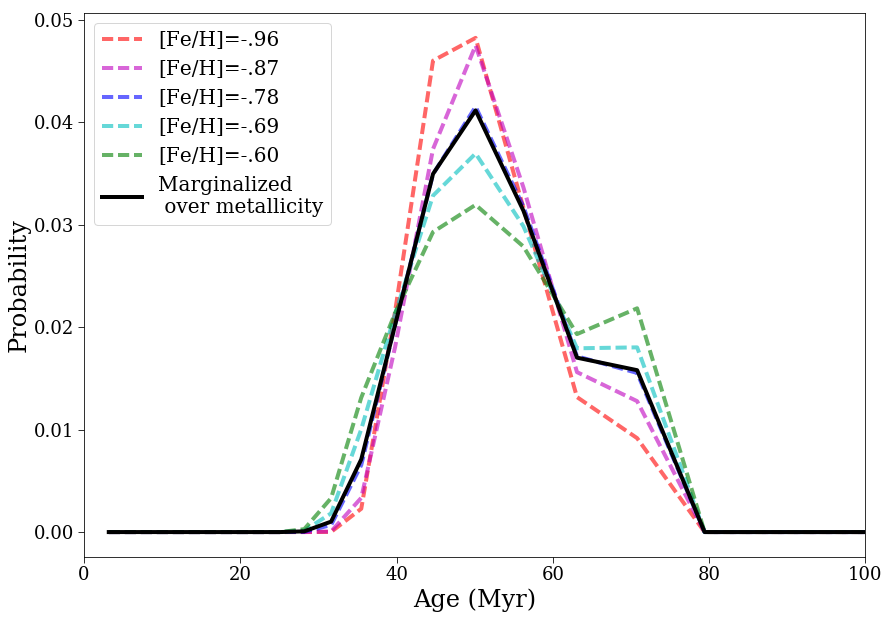

7.7


In [439]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(10**(CChi[0, 0, :, 3, 0])/1e6, probs[0,0,:]/np.trapz(probs[0,0,:], 10**(CChi[0, 0, :, 3, 0])/1e6), 'r--', linewidth=4, alpha=.6, label='[Fe/H]=-.96')
plt.plot(10**(CChi[1, 0, :, 3, 0])/1e6, probs[1,0,:]/np.trapz(probs[1,0,:], 10**(CChi[1, 0, :, 3, 0])/1e6), 'm--', linewidth=4, alpha=.6, label='[Fe/H]=-.87')
plt.plot(10**(CChi[2, 0, :, 3, 0])/1e6, probs[2,0,:]/np.trapz(probs[2,0,:], 10**(CChi[2, 0, :, 3, 0])/1e6), 'b--', linewidth=4, alpha=.6, label='[Fe/H]=-.78')
plt.plot(10**(CChi[3, 0, :, 3, 0])/1e6, probs[3,0,:]/np.trapz(probs[3,0,:], 10**(CChi[3, 0, :, 3, 0])/1e6), 'c--', linewidth=4, alpha=.6, label='[Fe/H]=-.69')
plt.plot(10**(CChi[4, 0, :, 3, 0])/1e6, probs[4,0,:]/np.trapz(probs[4,0,:], 10**(CChi[4, 0, :, 3, 0])/1e6), 'g--', linewidth=4, alpha=.6, label='[Fe/H]=-.60')

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs[0,0,:] * norm(-.96) + probs[1,0,:] * norm(-.87) + probs[2,0,:] * norm(-.78) + 
            probs[3,0,:] * norm(-.69) + probs[4,0,:] * norm(-.60))/(
            norm(-.96) + norm(-.87) + norm(-.78) + norm(-.69) + norm(-.60))
plt.plot(10**(CChi[0,0,:,3,0])/1e6, probs_tot/np.trapz(probs_tot, 10**(CChi[0, 0, :, 3, 0])/1e6), 'k', linewidth=4, label='Marginalized \n over metallicity')

plt.ylabel("Probability", size=24)
plt.xlabel("Age (Myr)", size=24)
plt.xlim(0,100)
plt.tick_params(axis='both', which='major', labelsize=18, length=6)
plt.tick_params(axis='both', which='minor', length=4)
ax.xaxis.set_major_locator(MultipleLocator(20))
ax.xaxis.set_minor_locator(MultipleLocator(5))
ax.set_yticks(np.arange(0, .06, .01));
plt.legend(fontsize=20, loc=2)
plt.show()

print(CChi[0,0,:,3,0][np.argmax(probs_tot)])

## Now running DOLPHOT with Curtis' params

In [2]:
catalog_curtis = np.loadtxt(Iax_dir+"/new_files/sn2008ha/sn2008.out5")

In [3]:
pos_predict_curtis = np.zeros((catalog_curtis.shape[0],2))
info_predict_curtis = np.zeros(np.shape(catalog_curtis))

j = 0 # Iteration variable for positions array
for i in range(catalog_curtis.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3.5     2. Sharpness < .3     3. Roundness < 1     4. Crowding < .1 
    if ((catalog_curtis[i][5] >= 3.5)&(abs(catalog_curtis[i][6]) < .3)&(abs(catalog_curtis[i][7]) < 1)
        &(catalog_curtis[i][9] < .1)):
        pos_predict_curtis[j][0] = catalog_curtis[i][2] # Assigns X position
        pos_predict_curtis[j][1] = catalog_curtis[i][3] # Assigns Y position
        info_predict_curtis[j] = catalog_curtis[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict_curtis = pos_predict_curtis[~np.all(pos_predict_curtis == 0, axis=1)]
info_predict_curtis = info_predict_curtis[~np.all(info_predict_curtis == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("New_Start(2017)/sn2008ha_Prediction_curtis.reg", pos_predict_curtis, '%5.2f')

In [55]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2008ha_200pc_curtis.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([22,2])
for i in range(22):
    region[i][0] = mysplit(text[i], ' ')[0]
    region[i][1] = mysplit(text[i], ' ')[1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
info_new = np.zeros([region.shape[0],info_predict_curtis.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict_curtis.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict_curtis[i][0])&(region[j][1] == pos_predict_curtis[i][1]):
        info_new[j] = info_predict_curtis[i]
        j = j + 1
        if j == region.shape[0]: break

In [58]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/new_files/sn2008ha/sn2008ha_f625w_crc.fits1.mag.5")
ascii_2 = open(Iax_dir + "/new_files/sn2008ha/sn2008ha_f625w_crc.fits1.mag.6")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(22)
for i in range(22):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [59]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
info = np.zeros(info_new.shape)
for i in range(22):
    if (concentration[i] < 2.3): # & (concentration[i] >= 0):
        info[i] = info_new[i]
info = info[~np.all(info == 0, axis=1)]

np.savetxt("New_Start(2017)/sn2008ha_NoClustersROI_new2.reg", info[:,2:4], '%5.2f')

In [61]:
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

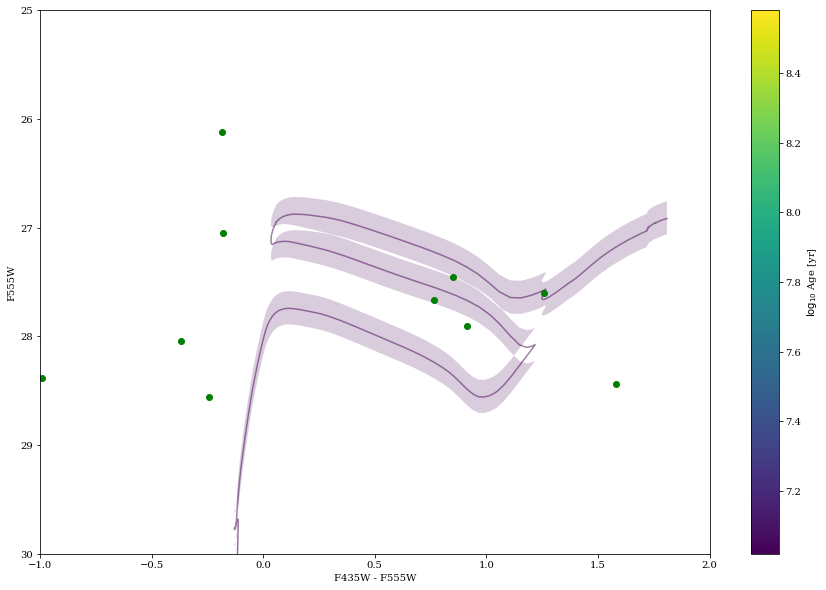

In [62]:
# fix metallicity, vary age
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.79) & (ages < 7.81)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(21.81e6) - 1)
    F435W_ext = 0.283 # extinction in F435W in UGC 12682 from NED
    F555W_ext = 0.219 # extinction in F555W in UGC 12682 from NED
    Gal_ext = 0
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.plot(info[:,15] - info[:,28], info[:,28], 'go')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(30,25)
plt.xlim(-1, 2)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

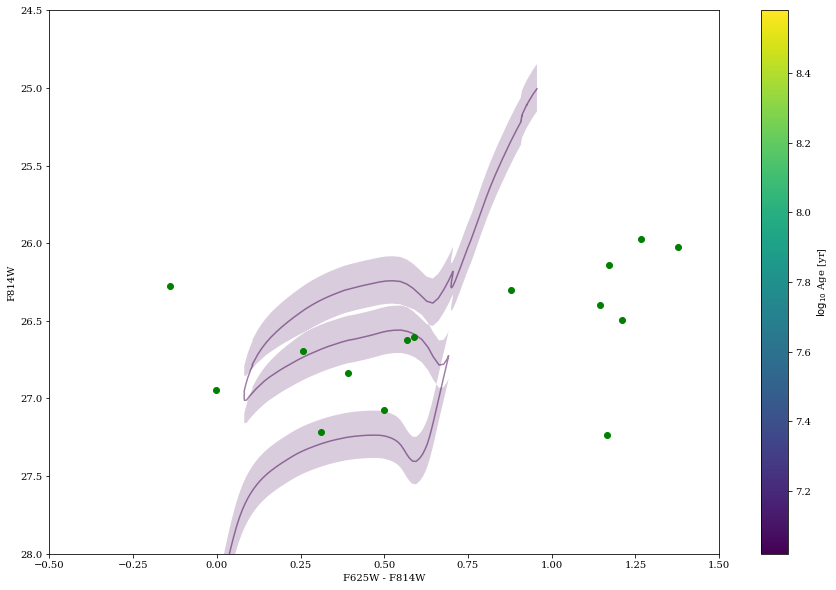

In [63]:
# fix metallicity, vary age
df = isochrones[-0.78]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.79) & (ages < 7.81)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F625W_ext = 0.174 # extinction in F625W in UGC 12682 from NED
    F814W_ext = 0.120 # extinction in F814W in UGC 12682 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F625W - df[idx].ACS_WFC_F814W + F625W_ext - F814W_ext + (2.219 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(F625W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.plot(info[:,41] - info[:,54], info[:,54], 'go')

plt.xlabel("F625W - F814W")
plt.ylabel("F814W")
plt.ylim(28,24.5)
plt.xlim(-.5, 1.5)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

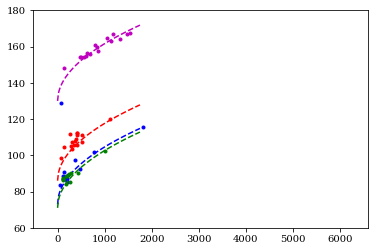

In [71]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 1750, num=100)

plt.plot(info[:,11], info[:,17]/1.0857 * info[:,11], 'b.')
plt.plot(x_array, 73 + np.sqrt(x_array), 'b--')
plt.plot(info[:,24], info[:,30]/1.0857 * info[:,24], 'g.')
plt.plot(x_array, 71 + np.sqrt(x_array), 'g--')
plt.plot(info[:,37], info[:,43]/1.0857 * info[:,37], 'r.')
plt.plot(x_array, 86 + np.sqrt(x_array), 'r--')
plt.plot(info[:,50], info[:,56]/1.0857 * info[:,50], 'm.')
plt.plot(x_array, 130 + np.sqrt(x_array), 'm--')
plt.ylim(60,180)
plt.show()

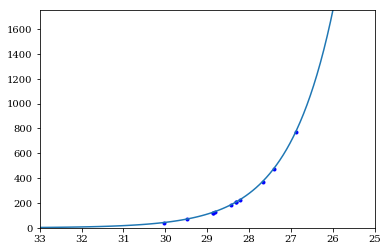

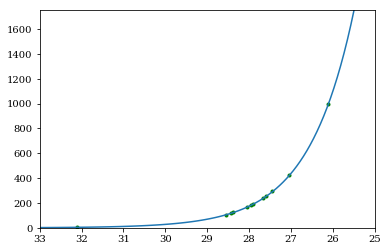

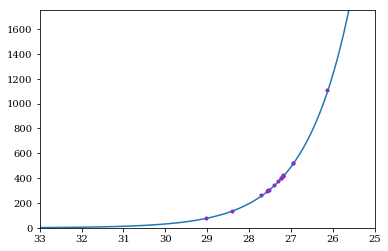

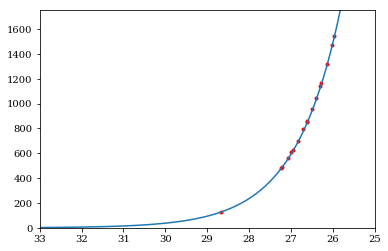

In [72]:
x_array = np.linspace(25,33,100)
plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,15], info[:,11], 'b.')
plt.plot(x_array, 1.85*1164 * 10**((25.769 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,28], info[:,24], 'g.')
plt.plot(x_array, 1.85*764 * 10**((25.722 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,41], info[:,37], 'm.')
plt.plot(x_array, 1.85*840 * 10**((25.743 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(info[:,54], info[:,50], 'r.')
plt.plot(x_array, 1.85*1240 * 10**((25.525 - x_array)/2.5))
plt.show()

In [83]:
metallicity = np.array([-.96, -.87, -.78, -.69, -.60])
reddening = np.array([0])
SN_pos = np.array([1690.2461, 3180.1444])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
CChi_temp = np.zeros([2,1])


for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity. Eventually this will be varied over.
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*red
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*red
            mag_625 = df[idx].ACS_WFC_F625W + dist_adjust + F625W_ext + 2.219*red
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*red
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(21.81e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(21.81e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (info[l,15] > 90) or (info[l,28] > 90) or (info[l,41] > 90) or (info[l,54] > 90):
                    continue
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - info[l,2])**2 + (SN_pos[1] - info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((info[l,15] - mag_435)**2
                  + (info[l,28] - mag_555)**2 + (info[l,41] - mag_625)**2 + (info[l,54] - mag_814)**2)))**2
    
            # There is one stars not counted, as it has >90 mag in some filter
            phys_dist_temp /= (info.shape[0] - 9)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

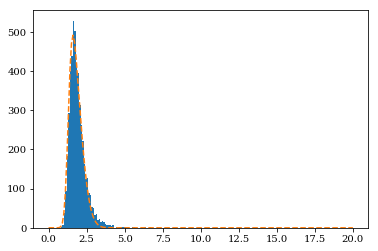

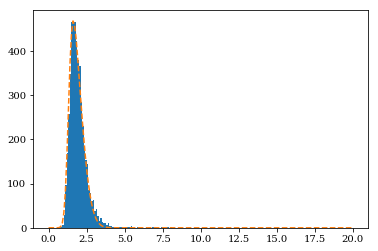

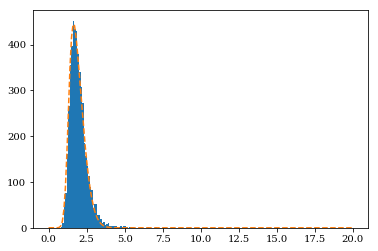

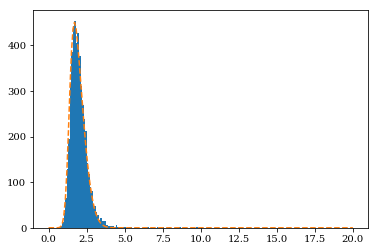

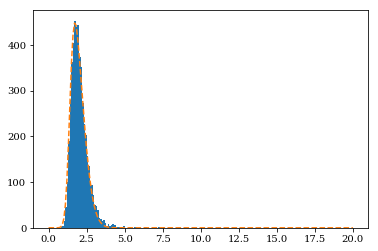

...

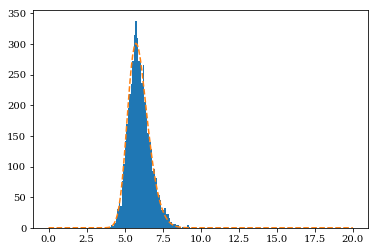

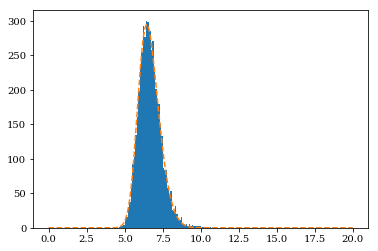

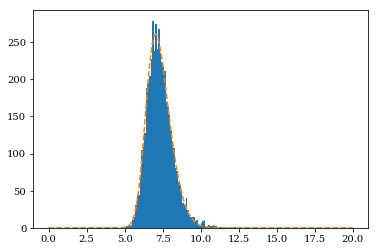

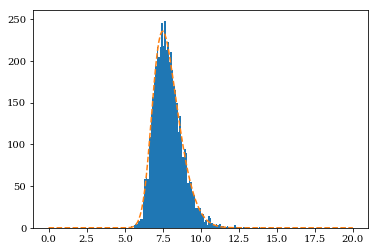

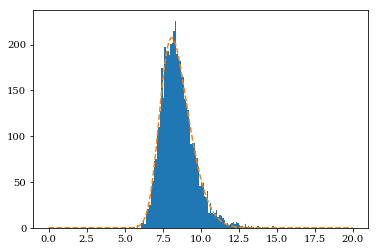

In [84]:
x = np.linspace(0,20,200)
probs = np.zeros([metallicity.size, reddening.size, 41])

CChi_false = np.load("MC_08ha_Curtis_Dolphot2/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,2,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(CChi_false[k,j,i,0,:], bins=np.linspace(0,20,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=(2000,3,2,2))
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 20, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

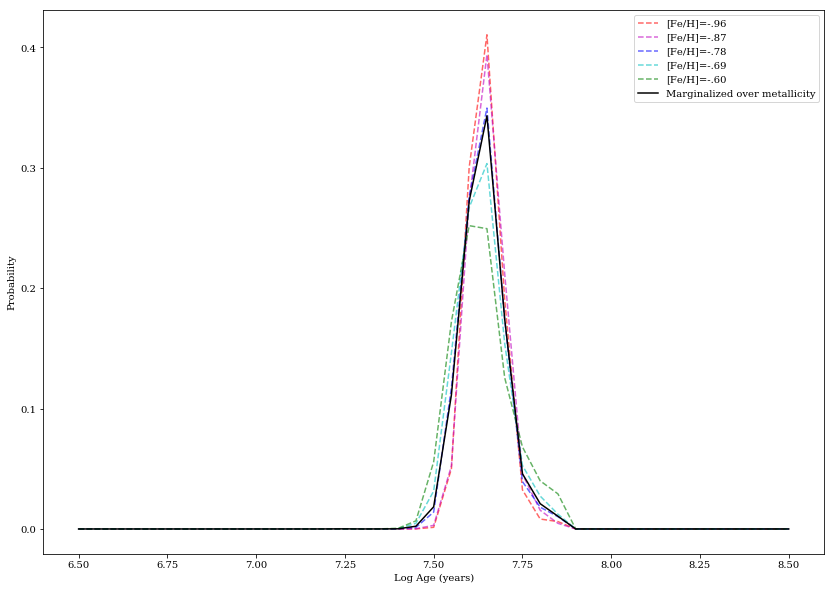

7.65


In [85]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', alpha=.6, label='[Fe/H]=-.96')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', alpha=.6, label='[Fe/H]=-.87')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', alpha=.6, label='[Fe/H]=-.78')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', alpha=.6, label='[Fe/H]=-.69')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', alpha=.6, label='[Fe/H]=-.60')

# Applying a gaussian prior
mu = -0.78
sigma = .09
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_tot = (probs[0,0,:] * norm(-.96) + probs[1,0,:] * norm(-.87) + probs[2,0,:] * norm(-.78) + 
            probs[3,0,:] * norm(-.69) + probs[4,0,:] * norm(-.60))/(
            norm(-.96) + norm(-.87) + norm(-.78) + norm(-.69) + norm(-.60))
plt.plot(CChi[0,0,:,3,0], probs_tot/np.sum(probs_tot), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()

print(CChi[0,0,:,3,0][np.argmax(probs_tot)])
np.save("Region_files/08ha_Mag_probs", probs_tot)